<div style="font-size:15px;line-height:1.5">

# Index
    
[1. Import Libraries](#1)<br>
    
[2. Import Data](#2)<br>
    
[3. Functions](#3)<br>
    
- [3.1 Visualisation Functions](#3.1)<br>
    
- [3.2 Data Wrangling Functions](#3.2)<br>

[4. Explanatory Data Analysis](#4)<br>

[5. Data Preperation](#5)<br>

- [5.1 First Preprosessing Iteration](#5.1)<br>  

- [5.2 Second Preprosessing Iteration](#5.2)<br> 
    
- [5.3 Feature Engineering](#5.3)<br>   
    
- [5.4 Power Transform](#5.4)<br>

- [5.5 Scaling](#5.5)<br>
    
- [5.6 Principal Component Analysis](#5.6)<br>
    
- [5.7 Explanatory Data Analysis - Checkup](#5.7)<br>

- [5.8 Build Perspectives](#5.8)<br>
    
[6. Clustering](#6)<br>

- [6.1 Hierarchical Clustering](#6.1)<br>
    
    - [6.1.1 All metrical variables](#6.1.1)<br> 
    
    - [6.1.2 Value View](#6.1.2)<br>  
    
    
- [6.2 Centroid Based Clustering](#6.2)<br> 
 
    - [6.2.1 K-Means](#6.2.1)<br>  
    
        - [6.2.1.1 All metrical variables](#6.2.1.1)<br> 
    
        - [6.2.1.2 Value View](#6.2.1.2)<br>  

    - [6.2.2 K-Prototypes](#6.2.2)<br> 
    
    
- [6.3 Density Based Clustering](#6.3)<br>   
 
    - [6.3.1 DBSCAN](#6.3.1)<br>  
    
        - [6.3.1.1 All metrical variables](#6.3.1.1)<br> 
    
        - [6.3.1.2 Value View](#6.3.1.2)<br>    

    - [6.3.2 Mean Shift Clustering](#6.3.1)<br>  
    
        - [6.3.2.1 All metrical variables](#6.3.2.1)<br> 
    
        - [6.3.2.2 Value View](#6.3.2.2)<br>
    
    
- [6.4 Distribution Based Clustering](#6.4)<br>   
 
    - [6.4.1 Gaussian Mixture Clustering](#6.4.1)<br>  
    
        - [6.4.1.1 All metrical variables](#6.4.1.1)<br> 
    
        - [6.4.1.2 Value View](#6.4.1.2)<br>  
    
    
- [6.5 Self Organizing Maps](#6.5)<br>
 
    - [6.5.1 Self Organizing Maps - Direct](#6.5.1)<br>
    
        - [6.5.1.1 All metrical variables](#6.5.1.1)<br>
    
    - [6.5.2 Emergent SOM + KMeans Clustering](#6.5.2)<br>
    
        - [6.5.2.1 All metrical variables](#6.5.2.1)<br>
    
    - [6.5.3 Emergent SOM + Agglomerative Clustering](#6.5.3)<br>
    
        - [6.5.3.1 All metrical variables](#6.5.3.1)<br>
    
    - [6.5.4 Emergent SOM + KMeans Clustering](#6.5.4)<br>
    
        - [6.5.4.1 Value View](#6.5.4.1)<br>
    
    - [6.5.5 Emergent SOM + Agglomerative Clustering](#6.5.5)<br>

        - [6.5.5.1 Value View](#6.5.5.1)<br>
    
[7. Model Assessment](#7)<br>  
    
- [7.1 Comparing R-squares & Silhouette Score](#7.1)<br>   
 
- [7.2 Inside analyses Perspective - All Features](#7.2)<br>  
     
- [7.3 Inside analyses Perspective - Value](#7.3)<br>      
    
- [7.4 Inside analyses Perspective - Demography](#7.4)<br>  
 
[8. Merging Perspectives](#8)<br>     
    
[9. Final Solution](#7)<br>   
    
[10. Semi-Supervised implementation](#7)<br>    
    
</div>

---
<a class="anchor" id="1"> 

# 1. Import Libraries

</a> 

In [1]:
import pandas                   as pd
import numpy                    as np
import matplotlib.pyplot        as plt 
import matplotlib.cm            as cm
import seaborn                  as sns
import math

from sklearn.impute                         import KNNImputer
from sklearn.preprocessing                  import StandardScaler
from sklearn.preprocessing                  import PowerTransformer
from sklearn.pipeline                       import make_pipeline
from sklearn.decomposition                  import PCA
from sklearn.metrics                        import silhouette_score, silhouette_samples, pairwise_distances

from sklearn.neighbors                      import NearestNeighbors

from sklearn.cluster                        import KMeans
from sklearn.cluster                        import AgglomerativeClustering
from sklearn.cluster                        import DBSCAN
from sklearn.cluster                        import MeanShift
from sklearn.cluster                        import estimate_bandwidth
from scipy.cluster.hierarchy                import dendrogram

from sklearn.manifold                       import TSNE

from sklearn.mixture                        import GaussianMixture

from sklearn.base                           import clone

from sklearn.model_selection                import train_test_split
from sklearn.model_selection                import cross_val_score
from sklearn.tree                           import DecisionTreeClassifier
from sklearn.tree                           import plot_tree

from matplotlib.patches                     import RegularPolygon, Ellipse
from matplotlib                             import cm, colorbar, colors as mpl_colors, __version__ as mplver
from matplotlib.lines                       import Line2D
from mpl_toolkits.axes_grid1.axes_divider   import make_axes_locatable

try:
    import umap.umap_ as umap
except ModuleNotFoundError:
    !pip install umap
    import umap.umap_ as umap

try:
    import textwrap3            as textwrap
except ModuleNotFoundError:
    !pip install textwrap3
    import textwrap3            as textwrap

try:
    from kmodes.kprototypes                 import KPrototypes
except ModuleNotFoundError:
    !pip install kmodes
    from kmodes.kprototypes                 import KPrototypes

try:
    from minisom                            import MiniSom
except ModuleNotFoundError:
    !pip install minisom
    from minisom                            import MiniSom

try:
    import sompy
except ModuleNotFoundError:
    !pip install git+https://github.com/compmonks/SOMPY.git
    import sompy 
    
from sompy.visualization.mapview           import View2D
from sompy.visualization.bmuhits           import BmuHitsView
from sompy.visualization.hitmap            import HitMapView

import warnings
warnings.filterwarnings('ignore')

import logging
logging.getLogger('matplotlib.font_manager').disabled = True

pd.options.mode.chained_assignment = None
sns.set_theme()

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

---
<a class="anchor" id="2"> 
    
# 2. Import Data

</a>

In [2]:
df = pd.read_sas('a2z_insurance.sas7bdat', index = 'CustID')

---
<a class="anchor" id="3"> 
    
# 3. Functions

</a>

<a class="anchor" id="3.1"> 
    
## 3.1 Visualisation Functions

</a> 

In [3]:
###############
# Plot population means
###############

def plot_means(df, labels):
    # Normalize the data
    df_norm = ((df - df.min()) / (df.max() - df.min()))
    # Get the mean of the normalized data
    means = df_norm.mean()
    # Add the labels to the normalized data
    df_norm['label'] = labels
    # Group the data by label
    grouped = df_norm.groupby('label')
    # Get the mean of each group
    means_by_label = grouped.mean()
    
    # Set up the plot
    fig, ax = plt.subplots(dpi=150)
    # Plot the overall mean as a scatterplot
    ax.scatter(means.values, means.index, marker='o', label='Population Mean', c='#000000')
    # Iterate through each group and plot the mean as a scatterplot
    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'gray', 'black', 'pink', 'yellow', '#ff00ff', '#bbf90f', '#00ffff', '#c79fef']
    
    color_count = 0
    
    for i, (label, row) in enumerate(means_by_label.iterrows()):
        ax.scatter(row.values, row.index, marker='x', label=label, c=colors[i])
        color_count += 1
    # Set the y-axis tick labels to be the same as the mean data
    ax.set_yticklabels(means.index)
    # Add a legend to the plot
    ax.legend(bbox_to_anchor=(1,1), loc="upper left")
    # Show the plot
    plt.show()



###############
# Correlation Heatmap
###############

def heatmap(dataframe, treshold=.05):
    '''plots correlation heatmap'''
    # calculate corelation matrix
    corr = dataframe.corr()
    f, ax = plt.subplots(figsize=(13,10))
    sns.heatmap(corr,cmap='Spectral',fmt='.2f')
    # this loop only labels fields in the heatmap abough a specific treshold (default .05)
    for i in range(len(corr)):
        for j in range(len(corr)):
            if abs(corr.iloc[i, j]) > treshold:
                ax.text(j+0.5, i+0.5, '{:.2f}'.format(corr.iloc[i, j]), 
                        ha='center', va='center', color='black')

###############
# Visualizing Component Planes (Self-Organizing-Maps)
###############

def plot_component_planes(weights, # Array of weights
                          features, # List of feature names
                          M=3, N=4, # Number of rows and columns
                          figsize=(20,20),
                          figlayout=(3,4),
                          title="Component Planes",
                          cmap=cm.magma
                         ):
    # create grids xx, yy
    xx, yy = np.meshgrid(np.arange(M), np.arange(N))
    xx = xx.astype(float)
    yy = yy.astype(float)

    xx[::-2] -= 0.5

    xx = xx.T
    yy = yy.T
    
    weights_ = weights.reshape((M,N,len(features)))

    fig = plt.figure(figsize=figsize, constrained_layout=True)
    subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)
    
    ## Normalize color scale to range of all values
    colornorm = mpl_colors.Normalize(vmin=np.min(weights), 
                                         vmax=np.max(weights))

    for cpi, sf in zip(range(len(features)), subfigs.flatten()):

        sf.suptitle(features[cpi], y=0.95)

        axs = sf.subplots(1,1, )
        axs.set_aspect('equal')

        ## Normalize color scale to range of values in each component
        colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                         vmax=np.max(weights_[:,:,cpi]))

        # iteratively add hexagons
        for i in range(weights_.shape[0]):
            for j in range(weights_.shape[1]):
                wy = yy[(i, j)] * np.sqrt(3) / 2
                hexagon = RegularPolygon((xx[(i, j)], wy), 
                                     numVertices=6, 
                                     radius=.99 / np.sqrt(3),
                                     facecolor=cmap(colornorm(weights_[i, j, cpi])), 
                                     alpha=1, 
                                     linewidth=.5,
                                     edgecolor=cmap(colornorm(weights_[i, j, cpi]))
                                    )
                axs.add_patch(hexagon)

        # only run this block if matplotlib >= 3.6.x
        mplv = [int(i) for i in mplver.split('.')]
        if mplv[1] >= 6:
            # Add colorbar
            divider = make_axes_locatable(axs)

            ax_cb = divider.append_axes("right", size="7%")#, pad="2%")

            # Create a Mappable object
            cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
            cmap_sm.set_array([])

            # Create custom colorbar 
            cb1 = colorbar.Colorbar(ax_cb,
                                    orientation='vertical', 
                                    alpha=1,
                                    mappable=cmap_sm
                                    )
            cb1.ax.get_yaxis().labelpad = 16

            # Add colorbar to plot
            sf.add_axes(ax_cb)

        # Remove axes for hex plot
        axs.margins(.05)
        axs.axis("off")

    fig.suptitle(title)
    plt.show()
    
plt.rcParams['figure.dpi'] = 72

###############
# Plot Clustering Performances
###############

def plot_scores(array_lists, df_list, label_lists):
    '''
    Function to plot r-squared and silhouette scores of the different clustering solutions
    Output is a barchart visualization comparing the different cluster solutions
    '''
    rows = len(array_lists)
    fig, axs = plt.subplots(rows, 2, figsize=(12, 5 * rows), dpi=150)
    plt.subplots_adjust(wspace=0.3)

    row_labels = ["All Features", "Perspective - Value", "Perspective- Demography", "DBSCAN ALL", "DBSCAN Value Perspective"]
    for i in range(rows):
        arrays = array_lists[i]
        df = df_list[i]
        labels = label_lists[i]
        # create lists to store scores
        r2_scores = []
        silhouette_scores = []
        # loop over each list of labels
        for j, array in enumerate(arrays):
            # calculate scores with "def r2" (see below)
            r2_score = r2(df, array)
            silhouette = silhouette_score(df,array)
            r2_scores.append(r2_score)
            silhouette_scores.append(silhouette)
    
            unique_count = len(np.unique(array))
            labels[j] = f"({labels[j]} {unique_count} cluster)"
        # add barchart to subplot
        ax1 = axs[i][0]
        ax1.bar(labels, r2_scores, color = '#bf5252')
        ax1.set_ylabel('R-Quadrat-Score')
        ax1.set_title(row_labels[i])
        ax1.set_xticklabels(labels, rotation=90)
        ax1.axhline(max(r2_scores), linestyle='dashed', color='red') 

        ax2 = axs[i][1]
        ax2.bar(labels, silhouette_scores)
        ax2.set_ylabel('Silhouette-Score')
        ax2.set_xticklabels(labels, rotation=90)
        ax2.axhline(max(silhouette_scores), linestyle='dashed', color='red') 
    fig.tight_layout()
    plt.show()

###############
# Plot Elbow Curve K-Prototype
###############

def plot_elbow_curve_Kpro(start, end, data):
    '''
    Function to plot K-Prototype elbow curve
    '''
    no_of_clusters = list(range(start, end+1))
    print(no_of_clusters)

    cost_values = []
    # loop over cluster sizes and fit & predict KPrototypes for each cluster size
    for k in no_of_clusters:
        test_model = KPrototypes(n_clusters=k, init='Huang', random_state=42)
        test_model.fit_predict(data, categorical=categorical_index)
        print(k,"Clusters Done")
        cost_values.append(test_model.cost_)
        
    sns.set_theme(style="whitegrid", palette="bright", font_scale=1.2)
    # set up lineplot
    plt.figure(figsize=(15, 7))
    ax = sns.lineplot(x=no_of_clusters, y=cost_values, marker="o", dashes=False)
    ax.set_title('Elbow curve', fontsize=18)
    ax.set_xlabel('No of clusters', fontsize=14)
    ax.set_ylabel('Cost', fontsize=14)
    ax.set(xlim=(start-0.1, end+0.1))
    plt.plot()

###############
# Visualization Functions for Cluster Results
###############

def cluster_plots(dataframe):
    '''
    Function to plot r-squared and silhouette score
    Will be used to find the optimal cluster sizes for all methods that include KMeans
    '''
    range_clusters = range(1, 11)
    inertia = []
    avg_silhouette = []
    # loop over possible cluster sizes
    for n_clus in range_clusters: 
        # calculate r-squared score via inertia_
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(dataframe)
        inertia.append(kmclust.inertia_)
        
        if n_clus == 1:
            continue
        # fit and predict for calculating silhouette score
        cluster_labels = kmclust.fit_predict(dataframe)
        # calculate silhouette score
        silhouette_avg = silhouette_score(dataframe, cluster_labels)
        avg_silhouette.append(silhouette_avg)

    # The inertia and average silhuette plots
    f, ax = plt.subplots(1, 2, figsize=(7,3), dpi=200)
    ax[0].plot(range_clusters, inertia)
    ax[0].set_xticks(range_clusters)
    ax[0].set_ylabel("Inertia: SSw", size=10)
    ax[0].set_xlabel("Number of clusters", size=10)
    ax[0].set_title("Elbow Method", size=10)
    ax[1].plot(range_clusters[1:],avg_silhouette)
    ax[1].set_xticks(range_clusters)
    ax[1].set_ylabel("Average silhouette", size=10)
    ax[1].set_xlabel("Number of clusters", size=10)
    ax[1].set_title("Average silhouette plot over clusters", size=10)
    plt.show()

def r2(features, labels):
    '''
    Function to calculate the r-squared score
    Will be used in the function "plot_scores"
    '''    
    def get_ss(dat):
        ss = np.sum(dat.var() * (dat.count() - 1))
        return ss 
    sst = get_ss(features)
    df = pd.DataFrame()
    df = features.copy()
    df['labels'] = labels.tolist()
    ssw_labels = df.groupby(by='labels').apply(get_ss) 
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst

    return r2
    
def overwiev_mean(features, labels):
    '''
    Creates a pandas dataframe with the means of each cluster
    '''
    feat = features.copy()
    feat['labels'] = labels.tolist()
    # group by labels and calculate the average/mean
    feat = feat.groupby('labels').mean()
    return feat
    
def plot_umap_tsne(dataframe, labels):
    '''
    Function to calculate and plot UMAP and T-SNE
    Both Visualizations are then plotted next to each other for comparison
    '''
    # make sure that no categorical features are in the input dataframe
    metric_features_eval = [i for i in dataframe.columns if not i in ['Education', 'Children']]
    # set coloring otherwise clusters have different colors in different visualizations (e.g. Radar Plot)
    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'gray', 'black', 'pink', 'yellow', '#ff00ff', '#bbf90f','#00ffff', '#c79fef']
    label_colors = [colors[i] for i in labels]

    dataframe = dataframe[metric_features_eval]
    #calculate umap and tsne
    umap_transformed = umap.UMAP(n_neighbors=20, min_dist=0.25).fit_transform(dataframe)
    tsne_transformed = TSNE(n_components=2, perplexity=60).fit_transform(dataframe)

    umap_x = umap_transformed[:, 0]
    umap_y = umap_transformed[:, 1]
    tsne_x = tsne_transformed[:, 0]
    tsne_y = tsne_transformed[:, 1]
    #create a subplot to be able to visualize both techniques next to each other
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), dpi=300)
    ax1.scatter(umap_x, umap_y, c=label_colors, s=1)
    ax1.set_title("UMAP")
    ax2.scatter(tsne_x, tsne_y, c=label_colors, s=3)
    ax2.set_title("TSNE")
    fig.tight_layout()
    plt.show()
       
def pairplot(features, labels):
    '''
    Returns a seaborn pairplot with hue set to the specific cluster colors
    '''
    feat = features.copy()
    feat = feat[[i for i in feat.columns if not i in ['EducDeg', 'Children']]]
    feat['labels'] = labels.tolist()
    # set coloring otherwise clusters have different colors in different visualizations (e.g. Radar Plot)
    color_palette = {0:'blue', 1:'orange', 2:'green', 3:'red', 4:'purple', 5:'brown', 6:'gray', 7:'black'}
    sns.pairplot(feat, hue='labels', palette = color_palette)
    plt.show()

def decision_tree_eval(dataframe, labels):
    '''
    Calculates a crossvalidated decision tree score
    Plots tree (max_depth=5)
    '''
    df_decision_tree = dataframe.copy()
    df_decision_tree['Clusters'] = labels
    # train test split
    x, y = df_decision_tree.drop(columns=['Clusters']), df_decision_tree.Clusters
    xtrain, xval, ytrain, yval = train_test_split(x,y)
    # calculate cross validated scores
    model = DecisionTreeClassifier()
    scores = cross_val_score(model, x, y, cv=5)
    # fit tree again for visualizing
    clf = DecisionTreeClassifier(max_depth=5).fit(xtrain,ytrain)
    # plot tree with sklearn "plot_tree" function
    fig, axe = plt.subplots(figsize=(60,15),dpi=200)
    plot_tree(clf, ax = axe, fontsize=15, feature_names=dataframe.columns, filled=True)
    plt.show()
    return np.mean(scores) 

# ComplexRadar Source:https://towardsdatascience.com/how-to-create-and-visualize-complex-radar-charts-f7764d0f3652
class ComplexRadar():
    def __init__(self, fig, variables, ranges, n_ring_levels=5, show_scales=True):
        # Calculate angles and create for each variable an axes
        # Consider here the trick with having the first axes element twice (len+1)
        angles = np.arange(0, 360, 360./len(variables))
        axes = [fig.add_axes([0.1,0.1,0.9,0.9], polar=True, label = "axes{}".format(i)) for i in range(len(variables)+1)]
       
        # Ensure clockwise rotation (first variable at the top N)
        for ax in axes:
            ax.set_theta_zero_location('N')
            ax.set_theta_direction(-1)
            ax.set_axisbelow(True)
       
        # Writing the ranges on each axes
        for i, ax in enumerate(axes):
 
            # Here we do the trick by repeating the first iteration
            j = 0 if (i==0 or i==1) else i-1
            ax.set_ylim(*ranges[j])
            # Set endpoint to True if you like to have values right before the last circle
            grid = np.linspace(*ranges[j], num=n_ring_levels,
                               endpoint=False)
            gridlabel = ["{}".format(round(x,2)) for x in grid]
            gridlabel[0] = "" # remove values from the center
            lines, labels = ax.set_rgrids(grid, labels=gridlabel, angle=angles[j])
           
            ax.set_ylim(*ranges[j])
            ax.spines["polar"].set_visible(False)
            ax.grid(visible=False)
           
            if show_scales == False:
                ax.set_yticklabels([])
 
        # Set all axes except the first one unvisible
        for ax in axes[1:]:
            ax.patch.set_visible(False)
            ax.xaxis.set_visible(False)
           
        # Setting the attributes
        self.angle = np.deg2rad(np.r_[angles, angles[0]])
        self.ranges = ranges
        self.ax = axes[0]
        self.ax1 = axes[1]
        self.plot_counter = 0
       
        # Draw (inner) circles and lines
        self.ax.yaxis.grid()
        self.ax.xaxis.grid()
 
        # Draw outer circle
        self.ax.spines['polar'].set_visible(True)
       
        # ax1 is the duplicate of axes[0] (self.ax)
        # Remove everything from ax1 except the plot itself
        self.ax1.axis('off')
        self.ax1.set_zorder(9)
       
        # Create the outer labels for each variable
        l, text = self.ax.set_thetagrids(angles, labels=variables)
       
        # Beautify them
        labels = [t.get_text() for t in self.ax.get_xticklabels()]
        labels = ['\n'.join(textwrap.wrap(l, 15,
                                          break_long_words=False)) for l in labels]
        self.ax.set_xticklabels(labels)
       
        for t,a in zip(self.ax.get_xticklabels(),angles):
            if a == 0:
                t.set_ha('center')
            elif a > 0 and a < 180:
                t.set_ha('left')
            elif a == 180:
                t.set_ha('center')
            else:
                t.set_ha('right')
 
        self.ax.tick_params(axis='both', pad=15)
 

    def _scale_data(self, data, ranges):
        """Scales data[1:] to ranges[0]"""
        for d, (y1, y2) in zip(data[1:], ranges[1:]):
            assert (y1 <= d <= y2) or (y2 <= d <= y1)
        x1, x2 = ranges[0]
        d = data[0]
        sdata = [d]
        for d, (y1, y2) in zip(data[1:], ranges[1:]):
            sdata.append((d-y1) / (y2-y1) * (x2 - x1) + x1)
        return sdata
       
    def plot(self, data, *args, **kwargs):
        """Plots a line"""
        sdata = self._scale_data(data, self.ranges)
        self.ax1.plot(self.angle, np.r_[sdata, sdata[0]], *args, **kwargs)
        self.plot_counter = self.plot_counter+1
   
    def fill(self, data, *args, **kwargs):
        """Plots an area"""
        sdata = self._scale_data(data, self.ranges)
        self.ax1.fill(self.angle, np.r_[sdata, sdata[0]], *args, **kwargs)
       
    def use_legend(self, *args, **kwargs):
        """Shows a legend"""
        self.ax1.legend(*args, **kwargs)
   
    def set_title(self, title, pad=25, **kwargs):
        """Set a title"""
        self.ax.set_title(title,pad=pad, **kwargs)    
        
def radar_plot(dataframe, labels):
 
    data = dataframe.copy()
 
    data['cluster'] = labels
    result = data.groupby(['cluster']).mean()
 
    min_max_per_variable = data.describe().T[['min', 'max']]
    min_max_per_variable['min'] = min_max_per_variable['min'].apply(lambda x: int(x))
    min_max_per_variable['max'] = min_max_per_variable['max'].apply(lambda x: math.ceil(x))
 
    variables = result.columns
    ranges = list(min_max_per_variable.itertuples(index=False, name=None))  
 
    fig1 = plt.figure(figsize=(10, 10))
    radar = ComplexRadar(fig1, variables, ranges, show_scales=True)
    # set coloring otherwise clusters have different colors in different visualizations (e.g. Radar Plot)
    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'gray', 'black', 'pink', 'yellow', '#ff00ff', '#bbf90f','#00ffff', '#c79fef']
    color_counter = 0
    # loop over cluster means and draw radar plot line
    for g in result.index:
        radar.plot(result.loc[g].values, label=f"cluster {g} (n = {len(data[data.cluster==g])})", **{'c':colors[g]})
        color_counter += 0
 
    radar.set_title('Radar Chart')
    radar.use_legend(loc='lower center', bbox_to_anchor=(0.15, -0.25),ncol=radar.plot_counter)
    plt.show()
    
###############
# Combine Visualizations Functions
###############

def cluster_viz_report(features_all_unscaled ,features_all_scaled, labels, verbose=1):
    '''
    Function to combine the visualization functions set up above
    depending on the input parameter verbose it's more or less detailed
    '''
    if verbose==1:
        print('\n\n--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------\n'),
        plot_means(features_all_unscaled, labels)
        print('\n\n--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------\n'),
        radar_plot(features_all_unscaled, labels)
            
    elif verbose==2:
        print('\n\n---------------------------------------------  VALUE OVERVIEW BY MEAN ------------------------------------------\n'),
        display(overwiev_mean(features_all_unscaled, labels)),
        print('\n\n--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------\n'),
        plot_means(features_all_unscaled, labels)
        print('\n\n--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------\n'),
        radar_plot(features_all_unscaled, labels)
        print('\n\n-------------------------------------------------- T-SNE & U-MAP -----------------------------------------------\n'),
        try:
            plot_umap_tsne(features_all_unscaled,labels),
        except:
            import umap.umap_ as umap
            plot_umap_tsne(features_all_unscaled,labels),
        print('\n\n-------------------------------------------------- DECISION TREE -----------------------------------------------\n'),
        decision_tree_eval(features_all_unscaled, labels),
            
    elif verbose==3:
        print('\n\n---------------------------------------------  VALUE OVERVIEW BY MEAN ------------------------------------------\n'),
        display(overwiev_mean(features_all_unscaled, labels)),
        print('\n\n--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------\n'),
        plot_means(features_all_unscaled, labels)
        print('\n\n--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------\n'),
        radar_plot(features_all_unscaled, labels),
        print('\n\n-------------------------------------------------- T-SNE & U-MAP -----------------------------------------------\n'),
        try:
            plot_umap_tsne(features_all_unscaled,labels),
        except:
            import umap.umap_ as umap
            plot_umap_tsne(features_all_unscaled,labels),
        print('\n\n-------------------------------------------------- DECISION TREE -----------------------------------------------\n'),
        decision_tree_eval(features_all_unscaled, labels),
        print('\n\n-------------------------------------------CLUSTER DISTRIBUTION BY FEATURE -------------------------------------\n'),
        pairplot(features_all_unscaled, labels)

<a class="anchor" id="3.2"> 
    
## 3.2 Data Wrangling Functions

</a> 

In [4]:
###############
# Preprocessing Step 1: Swap wrong FirstPolYears with BirthYears
###############

def logic_eval_1(dataframe, **kwargs):
    '''FirstPolYear swap'''
    condition = dataframe.FirstPolYear < dataframe.BirthYear
    dataframe.loc[condition, ['FirstPolYear', 'BirthYear']] = (dataframe.loc[condition, ['BirthYear', 'FirstPolYear']].values)
    return dataframe

###############
# Preprocessing Step 2: Drop duplicates
###############

def drop_dups(dataframe, **kwargs):
    return dataframe.drop_duplicates()

###############
# Preprocessing Step 3: Impute non-metric features with mode
###############

def cat_imputer(dataframe, **kwargs):
    '''Impute categorical features with mode'''
    global cat_var
    cat_var = ['EducDeg','Children','GeoLivArea']
    for col in cat_var:
        dataframe[col].fillna(dataframe[col].mode().item(), inplace=True)
    return dataframe

###############
# Preprocessing Step 4: Encode categorical variables
###############
def cat_encode(dataframe, **kwargs):
    '''Ordinal encode EducDeg column'''
    dataframe["EducDeg"] = [4 if "PhD" in str(i) else 3 if "BSc" in str(i)  else 2 if "High School" in str(i) else 1 for i in dataframe['EducDeg']]
    return dataframe

###############
# Preprocessing Step 5: Save categorical features and drop them from clustering dataframe
###############
def cat_drop(dataframe, **kwargs):
    '''Save (for interpretation) and Drop (for clustering) categorical features'''
    global categorical_features
    categorical_features = dataframe[cat_var]
    return dataframe.drop(columns=cat_var)

###############
# Preprocessing Step 6: Outlier flooring and capping via IQR or manually handling of outliers
###############

def outlier_removal(dataframe, **kwargs):
    '''Flooring & Capping IQR outliers - If cap set to FALSE the observations will be removed'''
    if kwargs and 'column_limits' in kwargs.keys():
        for col in dataframe.columns:
            if col in kwargs['column_limits'].keys():
                ser = dataframe[col][dataframe[col].between(kwargs['column_limits'][col][0],kwargs['column_limits'][col][1])]
                print(f'Observation loss ({col}): {round(1-(len(ser)/len(dataframe)),4)}%')
                dataframe = dataframe[dataframe[col].between(kwargs['column_limits'][col][0],kwargs['column_limits'][col][1])]
            else:
                q1, q3 = np.nanquantile(dataframe[col], 0.25), np.nanquantile(dataframe[col], 0.75)
                iqr = q3 - q1
                lower_bound, upper_bound = q1-(1.5*iqr), q3+(1.5*iqr)
                dataframe[col] = [lower_bound if i < lower_bound else upper_bound if i > upper_bound else i for i in dataframe[col]]
        return dataframe
    elif kwargs and kwargs['kwargs_cap'] == False:
        rows_to_drop = set()
        for col in dataframe.columns:
            q1, q3 = np.nanquantile(dataframe[col], 0.25), np.nanquantile(dataframe[col], 0.75)
            iqr = q3 - q1
            lower_bound, upper_bound = q1-(1.5*iqr), q3+(1.5*iqr)
            rows_to_drop.update(dataframe[~dataframe[col].between(lower_bound, upper_bound, inclusive='both')].index)
        return dataframe.loc[~dataframe.index.isin(list(rows_to_drop))]
    else:
        for col in dataframe.columns:
            q1, q3 = np.nanquantile(dataframe[col], 0.25), np.nanquantile(dataframe[col], 0.75)
            iqr = q3 - q1
            lower_bound, upper_bound = q1-(1.5*iqr), q3+(1.5*iqr)
            dataframe[col] = [lower_bound if i < lower_bound else upper_bound if i > upper_bound else i for i in dataframe[col]]
        return dataframe

###############
# Preprocessing Step 7: Drop underaged and check for TotalPrem < Salary
###############

def logic_eval_2(dataframe, **kwargs):
    '''Drop underaged and check for TotalPrem < Salary'''
    dataframe = dataframe[(2016 - dataframe.BirthYear) > 17]
    dataframe = dataframe[dataframe.loc[:, dataframe.columns.str.startswith('Prem')].sum(axis=1) < dataframe["MonthSal"]*12]
    return dataframe

###############
# Preprocessing Step 8: KNN-Imputation of missing values
###############

def knn_imputer(dataframe, **kwargs):
    # Scale the data for the imputation
    scl = StandardScaler()
    df_scaled=pd.DataFrame(scl.fit_transform(dataframe), index = dataframe.index ,columns = dataframe.columns)
    # Impute Values
    imputer = KNNImputer(missing_values=np.nan)
    df_imputed_scaled = pd.DataFrame(imputer.fit_transform(df_scaled),columns=df_scaled.columns, index=df_scaled.index )
    # Inverse transform the values
    df_imputed_unscaled=pd.DataFrame(scl.inverse_transform(df_imputed_scaled),index = df_imputed_scaled.index ,columns = df_imputed_scaled.columns)
    return df_imputed_unscaled

###############
# Preprocessing: Run all functions
###############

def preprocessing(dataframe, **kwargs):
    '''
    Combines all the different preprocessing functions set up above
    '''
    preprocessing_funcs = [
        logic_eval_1,
        drop_dups,
        cat_imputer,
        cat_encode,
        cat_drop,
        outlier_removal,
        logic_eval_2,
        knn_imputer
        ]
    
    res = dataframe
    for func in preprocessing_funcs:
        res = func(res, **kwargs)
    
    return res

###############
# Power transformation to get data into more gaussian like shape
###############

def power_trans(dataframe, column_list):
    '''
    Applies PowerTransform on the columns provided in the input "column_list"
    '''
    for col in column_list:
        pt = PowerTransformer()
        dataframe[col] = pt.fit_transform(pd.DataFrame(dataframe[col]))
    return dataframe

###############
# PCA 
###############

def principal_component_analysis(dataframe, var_treshold=0.8):
    '''
    Checks for number of PCA's
    '''
    pca = PCA(n_components=var_treshold)
    pca_feat = pca.fit_transform(dataframe)
    pca_feat_names = [f'PC{i}' for i in range(pca.n_components_)]
    
    return pd.DataFrame(pca.explained_variance_ratio_, index=pca_feat_names, columns = ["Explained Variance"])

###############
# R-Squared Scores
###############

def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

########################################################
# R-Squared Scores (hierarchical)
########################################################
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

---
<a class="anchor" id="4">
    
# 4. Explanatory Data Analysis

</a>

In [5]:
# get first look of the data
df

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,1949.0,b'4 - PhD',3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293.0,1977.0,1952.0,b'1 - Basic',2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294.0,1994.0,1976.0,b'3 - BSc/MSc',2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


In [6]:
# check dtypes
df.dtypes

FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [7]:
# check for missing values
pd.concat([df.isnull().sum(),df.eq('').sum(), df.eq('null').sum(), df.eq('NAN').sum(),  df.eq('nil').sum()],keys=['Nulls','Empty Strings', "Null", "NAN", "nil"],axis=1)

,Nulls,Empty Strings,Null,NAN,nil
FirstPolYear,30,0,0,0,0
BirthYear,17,0,0,0,0
EducDeg,17,0,0,0,0
MonthSal,36,0,0,0,0
GeoLivArea,1,0,0,0,0
Children,21,0,0,0,0
CustMonVal,0,0,0,0,0
ClaimsRate,0,0,0,0,0
PremMotor,34,0,0,0,0
PremHousehold,0,0,0,0,0


In [8]:
# check for duplicated values
df.duplicated().sum()

3

In [9]:
# descriptive statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10266.0,1991.062634,511.267913,1974.00,1980.00,1986.00,1992.0000,53784.00
BirthYear,10279.0,1968.007783,19.709476,1028.00,1953.00,1968.00,1983.0000,2001.00
MonthSal,10260.0,2506.667057,1157.449634,333.00,1706.00,2501.50,3290.2500,55215.00
GeoLivArea,10295.0,2.709859,1.266291,1.00,1.00,3.00,4.0000,4.00
Children,10275.0,0.706764,0.455268,0.00,0.00,1.00,1.0000,1.00
CustMonVal,10296.0,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,0.742772,2.916964,0.00,0.39,0.72,0.9800,256.20
PremMotor,10262.0,300.470252,211.914997,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10296.0,210.431192,352.595984,-75.00,49.45,132.80,290.0500,25048.80
PremHealth,10253.0,171.580833,296.405976,-2.11,111.80,162.81,219.8200,28272.00


Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.


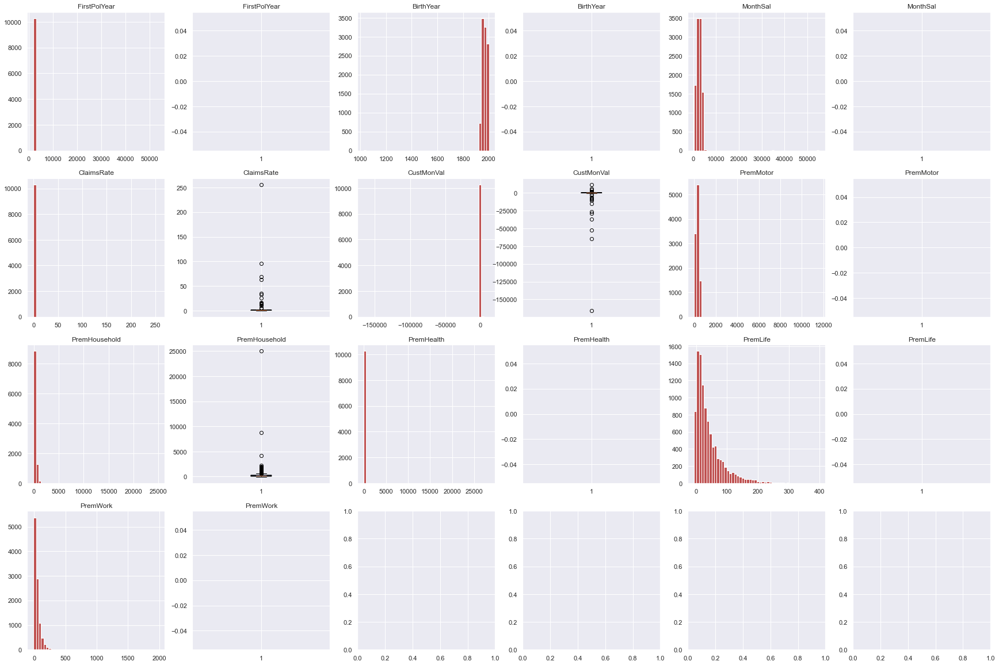

In [10]:
# plotting barchart and boxplot of the metric features (list below)
metric_features = ['FirstPolYear', 'BirthYear', 'MonthSal','ClaimsRate', 'CustMonVal',
                   'PremMotor', 'PremHousehold', 'PremHealth','PremLife', 'PremWork' ]

df_metric_features = df[metric_features]

fig, ax = plt.subplots(4,6, figsize = (30,20))
ax_flat1 = list(ax.flatten())[::2]
ax_flat2 = list(ax.flatten())[1::2]
for i, feat in zip(range(len(ax_flat1)), metric_features):
    ax_flat1[i].hist(df_metric_features[feat], bins = 50, color = '#bf5252')
    ax_flat2[i].boxplot(df_metric_features[feat], notch = True, patch_artist = True)
    ax_flat1[i].set_title(feat)
    ax_flat2[i].set_title(feat)

plt.show()

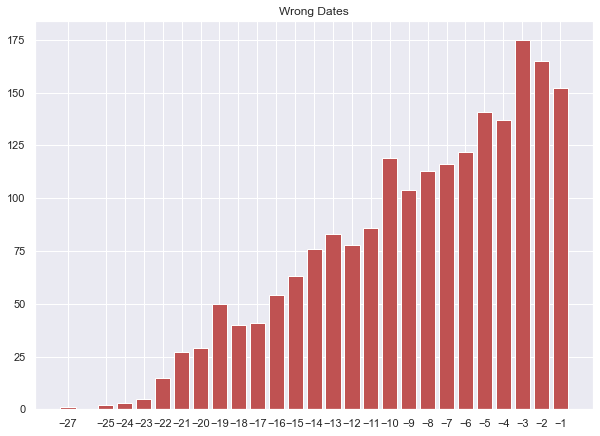

In [11]:
# FirstPolYear smaller than BirthYear
# not possible

policy_before_birth = df_metric_features[df_metric_features.FirstPolYear < df_metric_features.BirthYear].FirstPolYear - df_metric_features[df_metric_features.FirstPolYear < df_metric_features.BirthYear].BirthYear

fig = plt.figure(figsize=(10,7))
labels, counts = np.unique(np.array(policy_before_birth), return_counts=True)
plt.bar(labels, counts, color = '#bf5252',align='center')
plt.title("Wrong Dates")
plt.gca().set_xticks(labels)
plt.show()

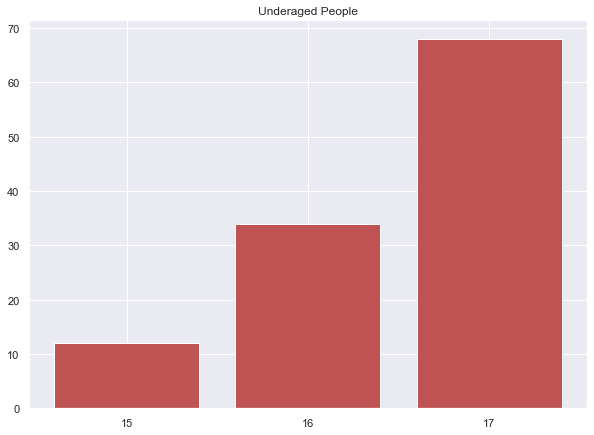

In [12]:
#  We will drop underaged people
# First we will assess if the Birth Dates and the First Policy Year Values
#Are correct

df_age = df_metric_features.copy()
df_age['Age'] = 2016 - df_age.BirthYear
df_age = df_age[df_age.Age<18].dropna()

fig = plt.figure(figsize=(10,7))
labels, counts = np.unique(np.array(df_age.Age), return_counts=True)
plt.bar(labels, counts, color = '#bf5252',align='center')
plt.title("Underaged People")
plt.gca().set_xticks(labels)
plt.show()

locator: <matplotlib.ticker.AutoLocator object at 0x0000022383FD9B20>
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


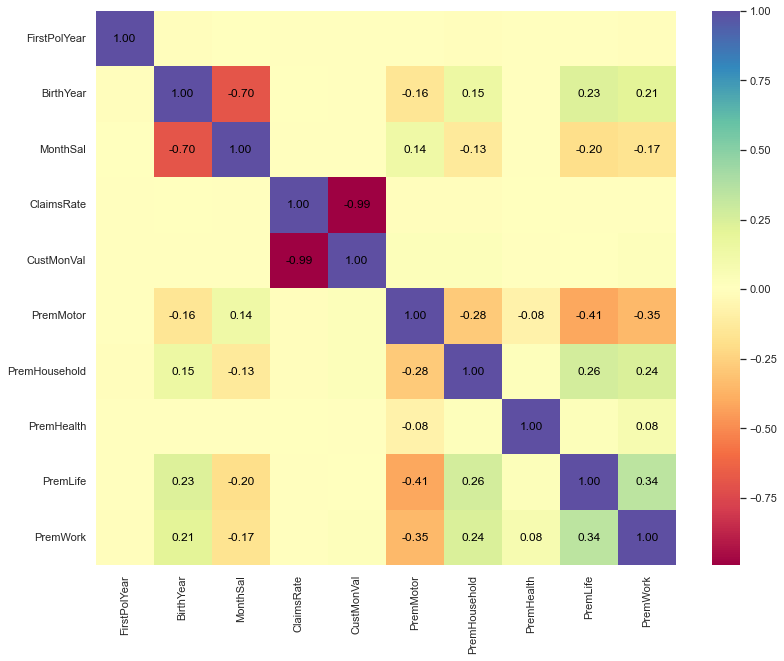

In [13]:
# Correlation of metric features (pearson : standard correlation coefficient)

heatmap(df_metric_features)

---
<a class="anchor" id="5"> 
    
# 5. Data Preperation

 </a>   

<a class="anchor" id="5.1">
    
## 5.1 First Preprosessing Iteration
    
</a>

In [14]:
# run all preprocessing functions

df_preprocessed_unscaled  = preprocessing(df)
df_categorical_features = categorical_features[categorical_features.index.isin(df_preprocessed_unscaled.index)]

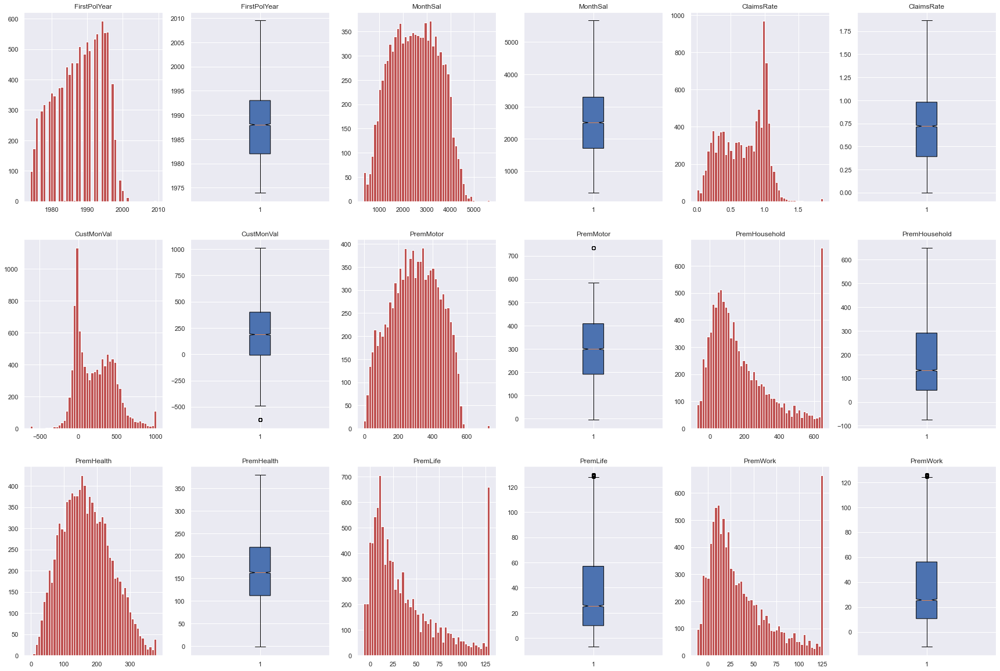

In [15]:
# plotting barchart and boxplot of the metric features (list below)
metric_features = ['FirstPolYear', 'MonthSal','ClaimsRate', 'CustMonVal',
                   'PremMotor', 'PremHousehold', 'PremHealth','PremLife', 'PremWork']

df_preprocessed_plot = df_preprocessed_unscaled[metric_features]

fig, ax = plt.subplots(3,6, figsize = (30,20))
ax_flat1 = list(ax.flatten())[::2]
ax_flat2 = list(ax.flatten())[1::2]
for i, feat in zip(range(len(ax_flat1)), metric_features):
    ax_flat1[i].hist(df_preprocessed_plot[feat], bins = 50, color = '#bf5252')
    ax_flat2[i].boxplot(df_preprocessed_plot[feat], notch = True, patch_artist = True)
    ax_flat1[i].set_title(feat)
    ax_flat2[i].set_title(feat)

plt.show()

In [16]:
df_decision_tree = df_preprocessed_unscaled.copy()

<a class="anchor" id="5.2"> 
    
## 5.2 Second Preprosessing Iteration

 </a> 

In [17]:
# cut off outliers manually with limits contained in dictionary below
preprocessing_kwargs = {'column_limits':{
                                        'PremMotor':(0,600),
                                        'PremHousehold':(-100,1200),
                                        'PremLife':(-10,250),
                                        'PremWork':(-15,250),
                                        'ClaimsRate':(0,1.5)
                                        }}

# run all preprocessing functions (this time with given kwargs)
df_preprocessed_unscaled  = preprocessing(df, **preprocessing_kwargs)
df_categorical_features = categorical_features[categorical_features.index.isin(df_preprocessed_unscaled.index)]

Observation loss (ClaimsRate): 0.0019%
Observation loss (PremMotor): 0.0039%
Observation loss (PremHousehold): 0.0048%
Observation loss (PremLife): 0.0137%
Observation loss (PremWork): 0.0122%


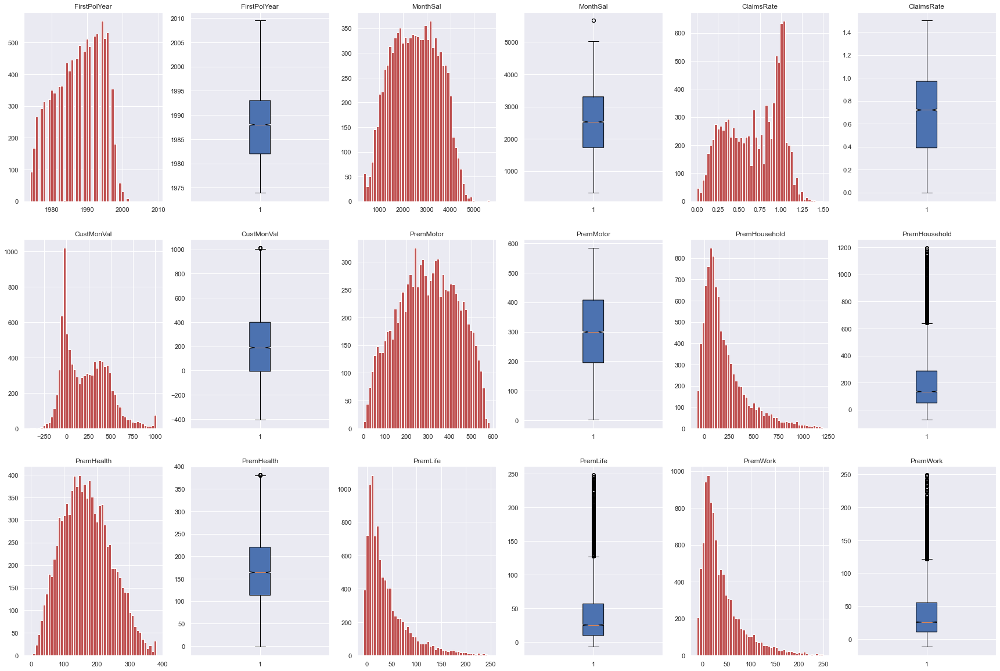

In [18]:
# plotting barchart and boxplot of the metric features (list below)
df_preprocessed_plot = df_preprocessed_unscaled.copy()

fig, ax = plt.subplots(3,6, figsize = (30,20))
ax_flat1 = list(ax.flatten())[::2]
ax_flat2 = list(ax.flatten())[1::2]
for i, feat in zip(range(len(ax_flat1)), metric_features):
    ax_flat1[i].hist(df_preprocessed_plot[feat], bins = 50, color = '#bf5252')
    ax_flat2[i].boxplot(df_preprocessed_plot[feat], notch = True, patch_artist = True)
    ax_flat1[i].set_title(feat)
    ax_flat2[i].set_title(feat)

plt.show()

---
<a class="anchor" id="5.3"> 
    
## 5.3 Feature Engineering

</a>   

In [19]:
# calculate additional variables

def feature_engineering(dataframe):
    dataframe_copy = dataframe.copy()
    dataframe_copy['Age'] = [2016-i for i in dataframe_copy['BirthYear']]
    dataframe_copy['PremTotal'] = dataframe_copy.loc[:, dataframe_copy.columns.str.startswith('Prem')].sum(axis=1)
    
    dataframe_copy = dataframe_copy.drop(columns=['BirthYear'])
    return dataframe_copy
    
#Addditonal variables which are redundant for clustering purposes but are interesting in terms of interpretation
def feature_engineering_large(dataframe):
    dataframe_copy = dataframe.copy()
    #Share of each insurance in comparison to the complete value
    dataframe_copy["Motor_Prem_Share"] =  dataframe_copy['PremMotor'] /dataframe_copy['PremTotal'] 
    dataframe_copy["Household_Prem_Share"] =  dataframe_copy['PremHousehold'] /dataframe_copy['PremTotal'] 
    dataframe_copy["Health_Prem_Share"] =  dataframe_copy['PremHealth'] /dataframe_copy['PremTotal'] 
    dataframe_copy["Life_Prem_Share"] =  dataframe_copy['PremLife'] /dataframe_copy['PremTotal'] 
    dataframe_copy["Work_Prem_Share"] =  dataframe_copy['PremWork'] /dataframe_copy['PremTotal'] 
    
    #Value of insurance in comparison to the monthly salary
    dataframe_copy["Motor_Sal_Prop"] =  dataframe_copy['PremMotor'] /(dataframe_copy['MonthSal']*12)
    dataframe_copy["Household_Sal_Prop"] =  dataframe_copy['PremHousehold'] /(dataframe_copy['MonthSal']*12) 
    dataframe_copy["Health_Sal_Prop"] =  dataframe_copy['PremHealth'] /(dataframe_copy['MonthSal']*12) 
    dataframe_copy["Life_Sal_Prop"] =  dataframe_copy['PremLife'] /(dataframe_copy['MonthSal']*12) 
    dataframe_copy["Work_Sal_Prop"] =  dataframe_copy['PremWork'] /(dataframe_copy['MonthSal']*12) 

    return dataframe_copy

In [20]:
df_feature_engineering = feature_engineering(df_preprocessed_unscaled)
df_preprocessed_unscaled_large = feature_engineering_large(feature_engineering(df_preprocessed_unscaled))

df_decision_tree = feature_engineering(df_decision_tree)

---
<a class="anchor" id="5.4">
    
## 5.4 Power Transform

</a> 

In [21]:
# Apply a power transform featurewise to make data more Gaussian-like

df_power_transform = df_feature_engineering.copy()

# cols = ['PremHousehold','PremLife','PremWork', "PremTotal"]
# df_power_transform = power_trans(df_power_transform, cols)

---
<a class="anchor" id="5.5">
    
## 5.4 Scaling

</a> 

In [22]:
# Scale data via StandardScaler

scl = StandardScaler()
df_scaled = pd.DataFrame(scl.fit_transform(df_power_transform), index = df_power_transform.index ,columns = df_power_transform.columns)

---
<a class="anchor" id="5.5"> 
    
## 5.5 Principal Component Analysis

</a> 

In [23]:
df_pca = df_scaled.copy()

In [24]:
# Number of components needed to explain 80% of the variance

principal_component_analysis(df_pca)

,Explained Variance
PC0,0.349018
PC1,0.187925
PC2,0.163208
PC3,0.093568
PC4,0.074660


---
<a class="anchor" id="5.6"> 
    
## 5.6 Explanatory Data Analysis - Checkup
    
</a>

In [25]:
#check for duplicates
df_feature_engineering.duplicated().sum()

1

In [26]:
# check for missing values
pd.concat([df_feature_engineering.isnull().sum(),df_feature_engineering.eq('').sum()],keys=['Nulls','Empty Strings'],axis=1)

,Nulls,Empty Strings
FirstPolYear,0,0
MonthSal,0,0
CustMonVal,0,0
ClaimsRate,0,0
PremMotor,0,0
PremHousehold,0,0
PremHealth,0,0
PremLife,0,0
PremWork,0,0
Age,0,0


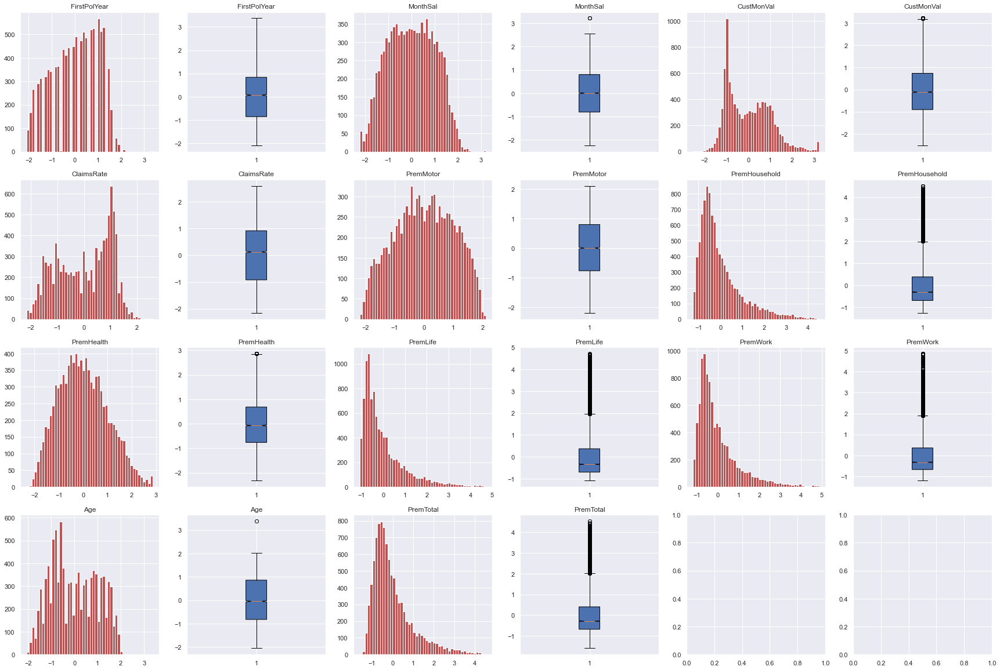

In [27]:
# plotting barchart and boxplot of the metric features (list below)
df_preprocessed_plot = df_scaled.copy()
metric_features = df_preprocessed_plot.columns

fig, ax = plt.subplots(4,6, figsize = (30,20))
ax_flat1 = list(ax.flatten())[::2]
ax_flat2 = list(ax.flatten())[1::2]
for i, feat in zip(range(len(ax_flat1)), metric_features):
    ax_flat1[i].hist(df_preprocessed_plot[feat], bins = 50, color = '#bf5252')
    ax_flat2[i].boxplot(df_preprocessed_plot[feat], notch = True, patch_artist = True)
    ax_flat1[i].set_title(feat)
    ax_flat2[i].set_title(feat)

plt.show()

locator: <matplotlib.ticker.AutoLocator object at 0x00000223866A43D0>
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved
top of Axes not in the figure, so title not moved


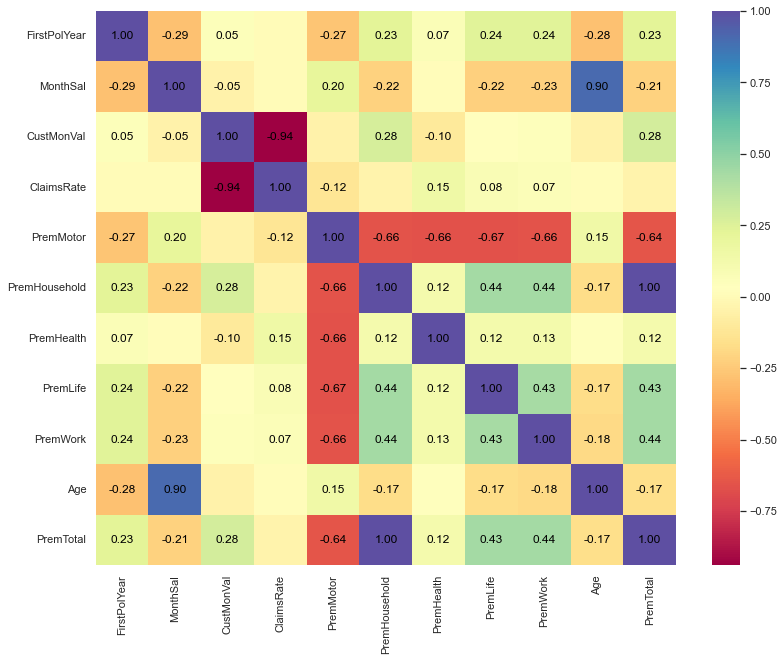

In [28]:
#Correlation of metric features (pearson : standard correlation coefficient)
heatmap(df_scaled)

In [29]:
# set up self organizing maps dataframe
data_som = df_scaled.copy()
data_som.set_index(data_som.index.astype(int), inplace=True)

In [30]:
# train self organizing map for visualizing the data
np.random.seed(42)
# train small map
sm_small = sompy.SOMFactory().build(
    data_som.values, 
    mapsize=[10, 10],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som
)
sm_small.train(n_job=1, verbose=0, train_rough_len=100, train_finetune_len=100)
# train large map
sm_large = sompy.SOMFactory().build(
    data_som.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som
)
sm_large.train(n_job=-1, verbose=0, train_rough_len=100, train_finetune_len=100)

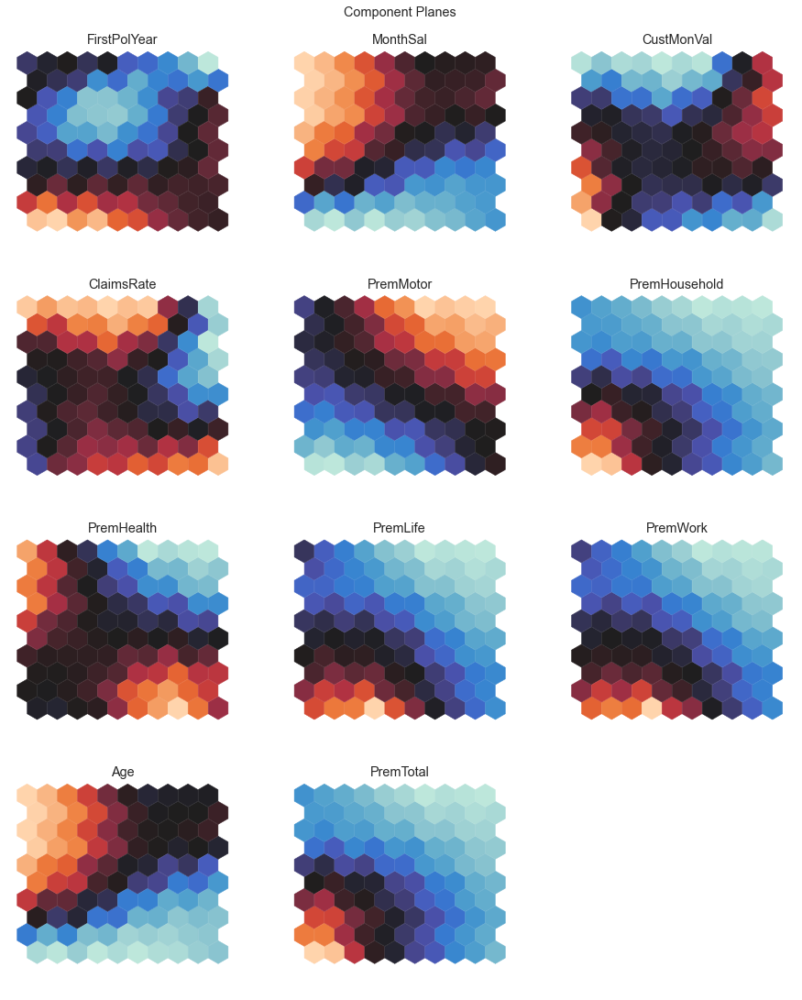

In [31]:
# visualize component planes with a small grid (10,10)
plot_component_planes(weights=sm_small.codebook.matrix, features=list(data_som.columns),
                      M=10,N=10,
                      figsize=(12,15),figlayout=(4,3),
                      title="Component Planes",
                      cmap=sns.color_palette("icefire", as_cmap=True))

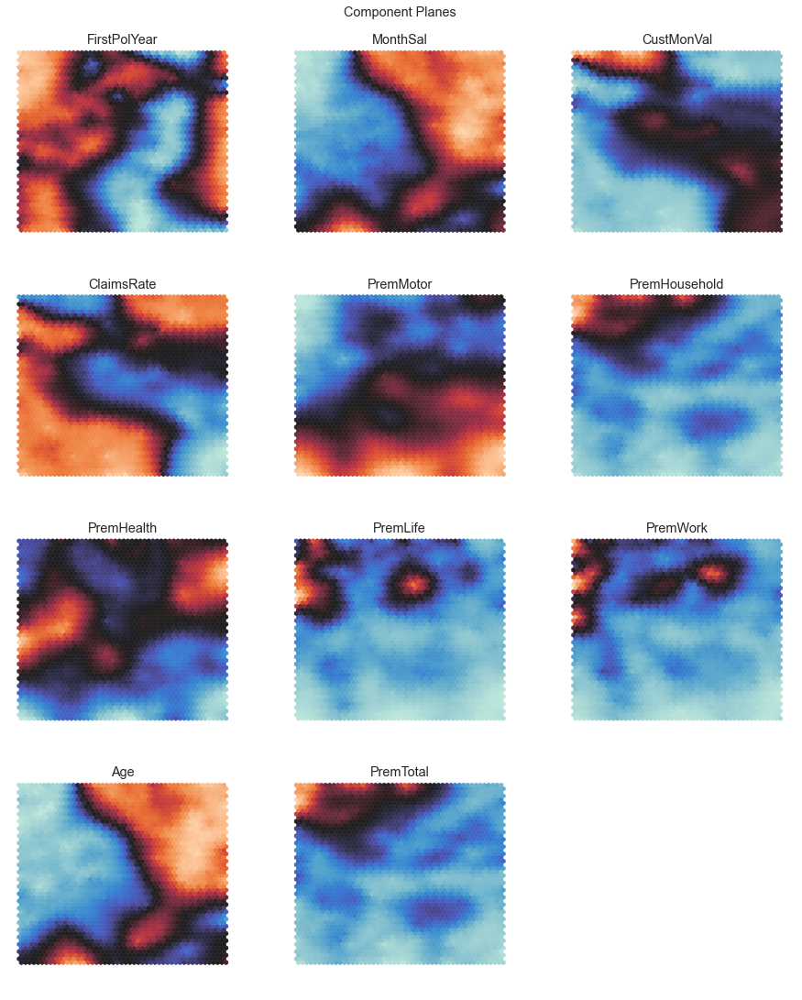

In [32]:
# visualize component planes with a large grid (50,50)
plot_component_planes(weights=sm_large.codebook.matrix, features=list(data_som.columns),
                      M=50,N=50,
                      figsize=(12,15),figlayout=(4,3),
                      title="Component Planes",
                      cmap=sns.color_palette("icefire", as_cmap=True))

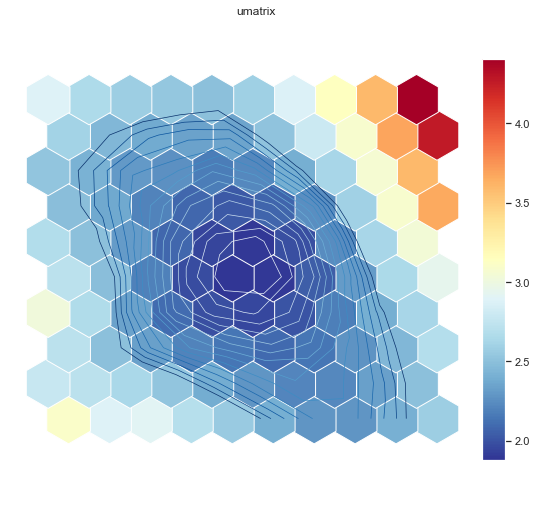

In [33]:
# visualize u-matrix of small map
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm_small, 
    distance=30,
    row_normalized=False,
    show_data=False, 
    contour=True)

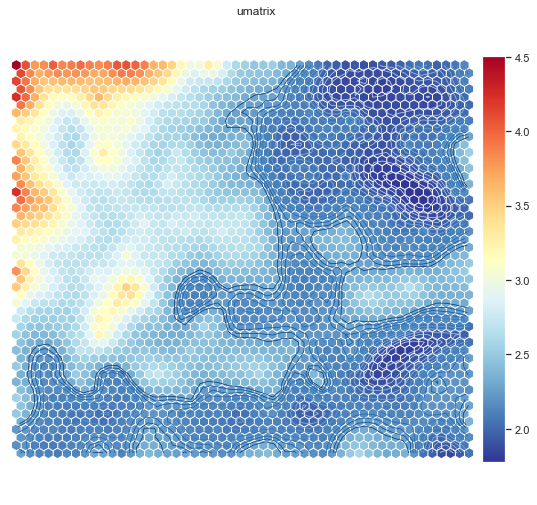

In [34]:
# visualize u-matrix of large map
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm_large, 
    distance=30,
    row_normalized=False,
    show_data=False, 
    contour=True)

---

In [35]:
# Remove variables for the complete perspectives
df_met_prepro_scaled = df_scaled.copy()

# set list of non-highly correlated features (based on the heatmap)
# the highly correlated features are commented out and are therefore not used for clustering
cor_in=[
    #'BirthYear',
    'MonthSal',
    'FirstPolYear',
    #'CustMonVal',
    'ClaimsRate',
    'PremMotor',
    'PremHousehold',
    'PremHealth',
    'PremLife',
    'PremWork',
    #'PremTotal',
    'Age'
]

# df contains all relevant features in a scaled state
metric_preprocessed_scaled = df_met_prepro_scaled[cor_in]

# df contain all relevant features in a un-scaled state
df_all_unscaled = df_feature_engineering.copy()
df_all_unscaled_cor = df_all_unscaled.copy()[cor_in]

---
<a class="anchor" id="5.7"> 
    
## 5.7 Build Perspectives

</a> 

In [36]:
demographic = [
    'Age',
    'MonthSal'
    ]

value = [
    'FirstPolYear',
    #'CustMonVal',
    'ClaimsRate',
    'PremMotor',
    'PremHousehold',
    'PremHealth',
    'PremLife',
    'PremWork',
    #'PremTotal'
]

# demographic based view (GeoLivArea gets dropped)
# combination of the features contained in the list "demographic" as well as the categorical features filtered out in preprocessing
df_demo = pd.concat([df_scaled[demographic], df_categorical_features], axis=1).drop(columns=['GeoLivArea'])
df_demo_unscaled = pd.concat([df_feature_engineering[demographic], df_categorical_features], axis=1).drop(columns=['GeoLivArea'])

# value based view
df_values = df_scaled[value]
df_values_unscaled = df_feature_engineering[value]

In [37]:
metric_features_eval = ['FirstPolYear', 'MonthSal','ClaimsRate', 'CustMonVal', 'PremMotor', 'PremHousehold', 'PremHealth','PremLife', 'PremWork', 'PremTotal', 'Age']

---
<a class="anchor" id="6"> 
    
# 6. Clustering

</a> 

<a class="anchor" id="6.1"> 
    
## 6.1 Hierarchical Clustering
    
</a>

<a class="anchor" id="6.1.1">
    
### 6.1.1 All metrical variables

</a> 

In [38]:
# Prepare a copy of a dataframe for the cluster method
# Distance based clustering -> scaled and metric data

df_agg = metric_preprocessed_scaled.copy()

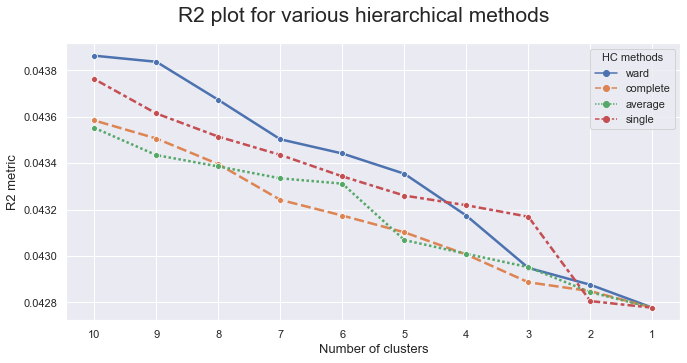

In [39]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        #Insert Metric and scaled data 
        get_r2_hc(df=df_agg, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [40]:
# train algorithm with best linkage
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df_agg)

array([7451, 9645, 6867, ...,    1,    2,    0], dtype=int64)

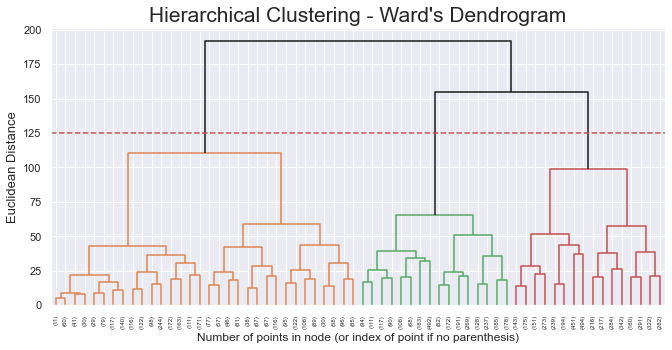

In [41]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 125
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [42]:
# 3 cluster solution
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=3)
agg_labels=hclust.fit_predict(df_agg)
agg_labels

array([1, 0, 0, ..., 1, 2, 1], dtype=int64)

<a class="anchor" id="6.1.2">
    
### 6.1.2 Value View 
    
</a>

In [43]:
# Prepare a copy of a dataframe for the cluster method
# Distance based clustering -> scaled and metric data

df_agg_val = df_values.copy()

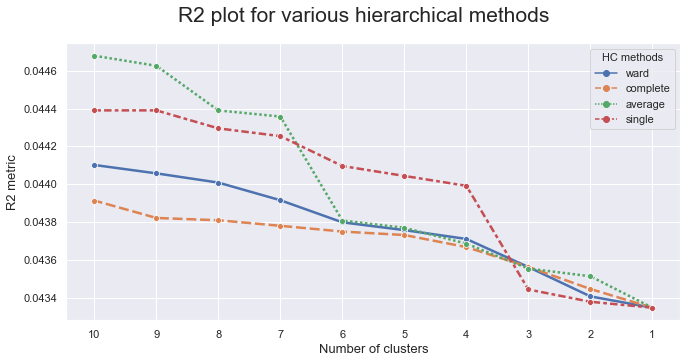

In [44]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        #Insert Metric and scaled data 
        get_r2_hc(df=df_agg_val, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [45]:
# train algorithm with best linkage
# using "single" resulted in bad interpretable results, that's why we chose the second best - "ward"
linkage = 'ward'
distance = 'euclidean'
hclust_val = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust_val.fit_predict(df_agg_val)

array([7859, 5004, 8789, ...,    6,    2,    0], dtype=int64)

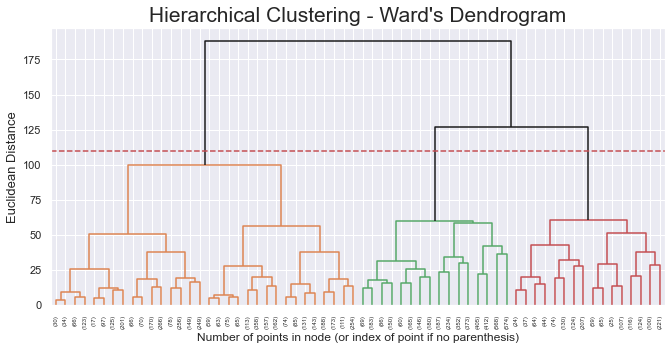

In [46]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust_val.children_.shape[0])
n_samples = len(hclust_val.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust_val.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust_val.children_, hclust_val.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 110
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [47]:
# 3 cluster solution
linkage = 'complete'
distance = 'euclidean'
hclust_val = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=3)
agg_val_labels=hclust_val.fit_predict(df_agg_val)
agg_val_labels

array([1, 2, 1, ..., 1, 2, 1], dtype=int64)

---
<a class="anchor" id="6.2"> 
    
## 6.2 Centroid Based Clustering

</a>

<a class="anchor" id="6.2.1"> 
    
### 6.2.1 K-Means 

</a> 

<a class="anchor" id="6.2.1.1"> 

#### 6.2.1.1 All metrical variables

</a>

In [48]:
# Prepare a copy of a dataframe for the cluster method
# Distance based clustering -> scaled and metric data
df_kmeans = metric_preprocessed_scaled.copy()

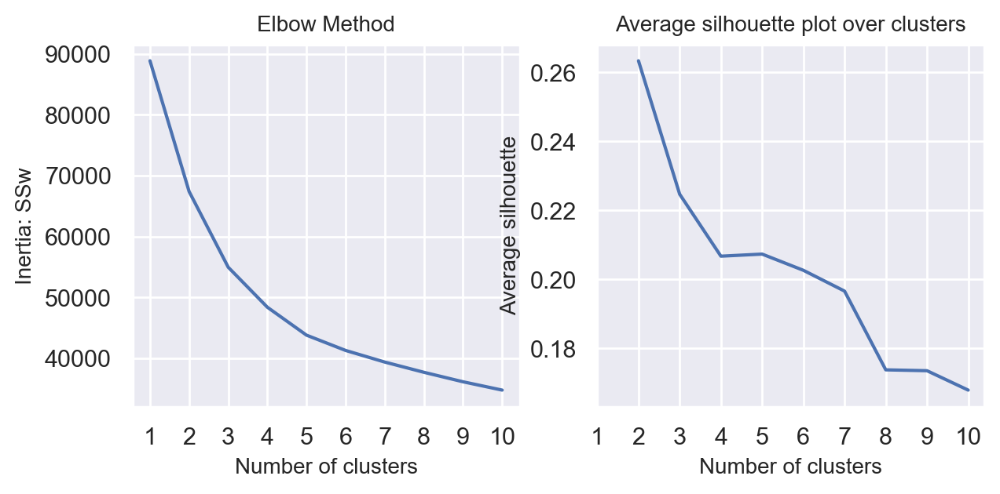

In [49]:
# plot elbow method and silhouette score to get optimal cluster size
cluster_plots(df_kmeans)

In [50]:
# create final labels with 4 clusters
kmeans_labels = KMeans(n_clusters=4, init='k-means++', random_state=420).fit_predict(df_kmeans)

<a class="anchor" id="6.2.1.2"> 
    
#### 6.2.1.2 Value View 

</a> 

In [51]:
# Prepare a copy of a dataframe for the cluster method
# Distance based clustering -> scaled and metric data

df_kmeans_val = df_values.copy()

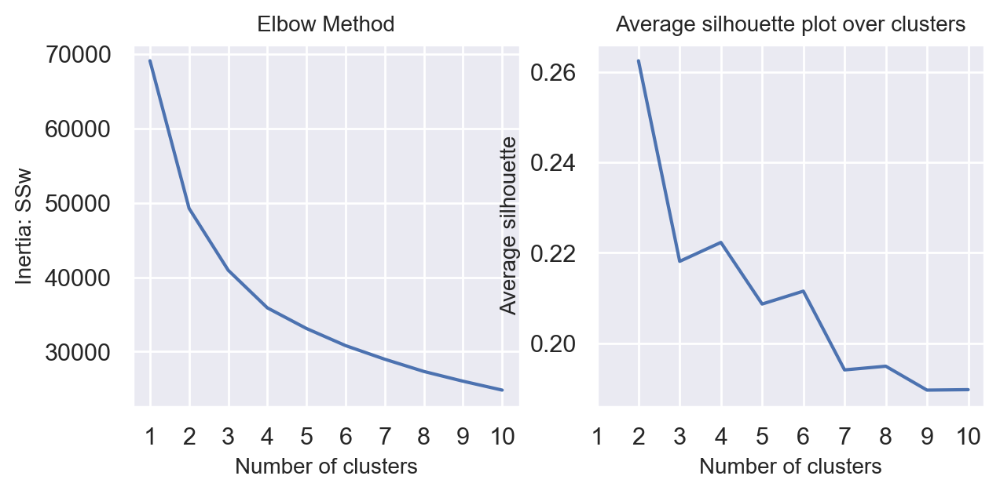

In [52]:
# plot elbow method and silhouette score to get optimal cluster size
cluster_plots(df_kmeans_val)

In [53]:
# create final labels with 4 clusters (value perspective)
kmeans_val_labels = KMeans(n_clusters=4, init='k-means++', random_state=420).fit_predict(df_kmeans_val)
kmeans_val_labels

array([3, 2, 2, ..., 3, 1, 3])

---
<a class="anchor" id="6.2.2">
    
### 6.2.2 K-Prototypes
  
</a>

In [54]:
# Prepare a copy of a dataframe for the cluster method
# Distance based clustering -> scaled and metric data

df_kp_demo = df_demo.copy()

In [55]:
# features used
df_kp_demo.columns

Index(['Age', 'MonthSal', 'EducDeg', 'Children'], dtype='object')

In [56]:
# https://medium.com/analytics-vidhya/customer-segmentation-using-k-prototypes-algorithm-in-python-aad4acbaaede
# dataframe to an array
smart_array = df_kp_demo.values

# All numerical datatypes need to be saved as type float
smart_array[:, 0] = smart_array[:,0].astype(float)
smart_array[:, 1] = smart_array[:,1].astype(float)


# make categorical features to index
# The k-prototype method needs an index of all categorical variables

categorical_index = list(range(2,4))
categorical_index

[2, 3]

[2, 3, 4, 5, 6]
2 Clusters Done
3 Clusters Done
4 Clusters Done
5 Clusters Done
6 Clusters Done


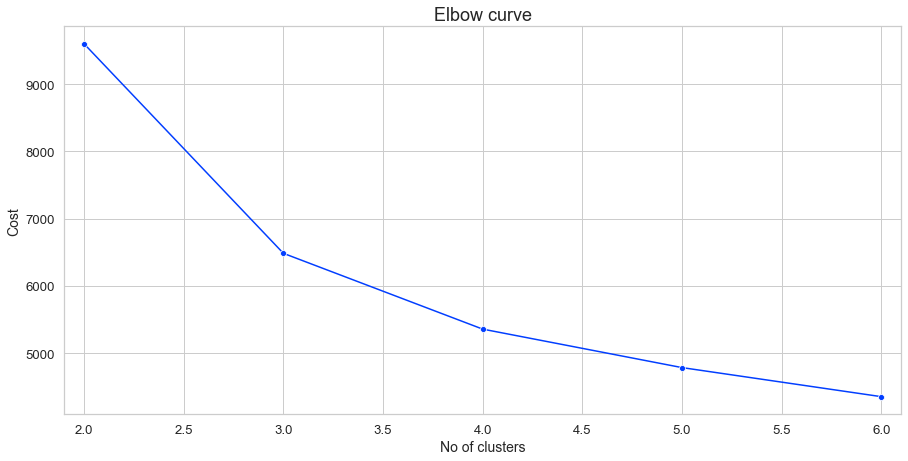

In [57]:
# Function for plotting elbow curve
# Plotting elbow curve for k=2 to k=6

plot_elbow_curve_Kpro(2,6,smart_array)

In [58]:
# create final labels with 3 clusters (demographic perspective)
kp_model = KPrototypes(n_clusters=3, init='Huang', random_state=42, n_jobs=-1)
kp_model.fit_predict(smart_array, categorical=categorical_index)
kp_dem_labels = kp_model.labels_.astype(int)

---
<a class="anchor" id="6.3"> 
    
## 6.3 Density Based Clustering

</a> 

<a class="anchor" id="6.3.1"> 
    
### 6.3.1 DBSCAN
    
</a>

<a class="anchor" id="6.3.1.1"> 
    
#### 6.3.1.1 All metrical variables

</a>    

In [59]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

df_dbscan =  metric_preprocessed_scaled.copy()

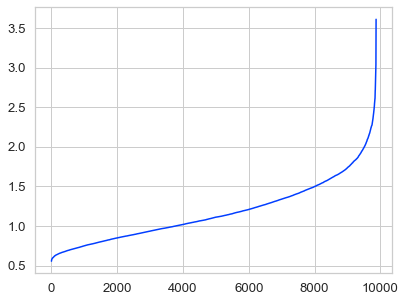

In [60]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df_dbscan)
distances, _ = neigh.kneighbors(df_dbscan)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [61]:
#Try out differnt min PTS to find out if there is a common density

for i in range(1, 20):
    dbscan = DBSCAN(eps=1.8, min_samples=i, n_jobs=4)
    cluster= dbscan.fit_predict(df_dbscan)

    dbscan_n_clusters = len(np.unique(cluster))
    print("Min_Samples:", i, "Clusters:", dbscan_n_clusters)

Min_Samples: 1 Clusters: 29
Min_Samples: 2 Clusters: 7
Min_Samples: 3 Clusters: 2
Min_Samples: 4 Clusters: 2
Min_Samples: 5 Clusters: 2
Min_Samples: 6 Clusters: 2
Min_Samples: 7 Clusters: 2
Min_Samples: 8 Clusters: 2
Min_Samples: 9 Clusters: 2
Min_Samples: 10 Clusters: 2
Min_Samples: 11 Clusters: 2
Min_Samples: 12 Clusters: 2
Min_Samples: 13 Clusters: 2
Min_Samples: 14 Clusters: 2
Min_Samples: 15 Clusters: 2
Min_Samples: 16 Clusters: 2
Min_Samples: 17 Clusters: 2
Min_Samples: 18 Clusters: 2
Min_Samples: 19 Clusters: 2


In [62]:
#ε- the neighborhood radius: EPS
#MinPts — the neighborhood density threshold: MinSamples
#https://towardsdatascience.com/a-practical-guide-to-dbscan-method-d4ec5ab2bc99

dbscan = DBSCAN(eps=1.8, min_samples=2, n_jobs=4)
df_dbscan['Cluster'] = dbscan.fit_predict(df_dbscan)

dbscan_n_clusters = len(np.unique(df_dbscan['Cluster']))
print("Number of estimated clusters : %d" % dbscan_n_clusters)
df_dbscan['Cluster'].unique()

Number of estimated clusters : 7


array([ 0, -1,  1,  2,  3,  4,  5], dtype=int64)

In [63]:
# Detecting noise and dropping (potential outliers)
df_dbscan_wo_out=df_dbscan.drop(df_dbscan.loc[df_dbscan['Cluster'] == -1].index)
db_outliers =df_dbscan.loc[df_dbscan['Cluster'] == -1].index
db_outliers

Float64Index([ 502.0,  559.0, 1464.0, 1895.0, 2594.0, 2983.0, 4249.0, 4363.0,
              5146.0, 5883.0, 5917.0, 6395.0, 6851.0, 7196.0, 7472.0, 8007.0,
              8262.0, 8742.0, 8873.0, 8982.0, 9150.0, 9295.0, 9556.0],
             dtype='float64', name='CustID')

In [64]:
# create final labels
db_labels = df_dbscan_wo_out["Cluster"]

<a class="anchor" id="6.3.1.2"> 
    
#### 6.3.1.2 Value View 

 </a>

In [65]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

df_dbscan_val =  df_values.copy()

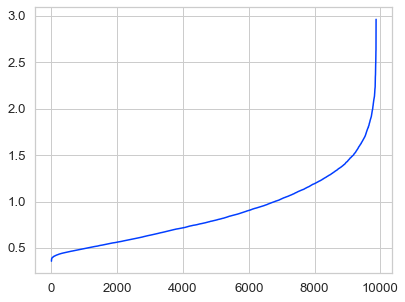

In [66]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df_dbscan_val)
distances, _ = neigh.kneighbors(df_dbscan_val)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [67]:
#Try out differnt min PTS to find out if there is a common density

for i in range(1, 20):
    dbscan = DBSCAN(eps=1.4, min_samples=i, n_jobs=4)
    cluster= dbscan.fit_predict(df_dbscan_val)

    dbscan_n_clusters = len(np.unique(cluster))
    print("Min_Samples:", i, "Clusters:", dbscan_n_clusters)

Min_Samples: 1 Clusters: 31
Min_Samples: 2 Clusters: 5
Min_Samples: 3 Clusters: 4
Min_Samples: 4 Clusters: 2
Min_Samples: 5 Clusters: 3
Min_Samples: 6 Clusters: 2
Min_Samples: 7 Clusters: 2
Min_Samples: 8 Clusters: 2
Min_Samples: 9 Clusters: 2
Min_Samples: 10 Clusters: 2
Min_Samples: 11 Clusters: 2
Min_Samples: 12 Clusters: 2
Min_Samples: 13 Clusters: 2
Min_Samples: 14 Clusters: 2
Min_Samples: 15 Clusters: 2
Min_Samples: 16 Clusters: 2
Min_Samples: 17 Clusters: 2
Min_Samples: 18 Clusters: 2
Min_Samples: 19 Clusters: 2


In [68]:
#ε- the neighborhood radius: EPS
#MinPts — the neighborhood density threshold: MinSamples
#https://towardsdatascience.com/a-practical-guide-to-dbscan-method-d4ec5ab2bc99

dbscan = DBSCAN(eps=1.4, min_samples=2, n_jobs=4)
df_dbscan_val['Cluster'] = dbscan.fit_predict(df_dbscan_val)

dbscan_val_n_clusters = len(np.unique(df_dbscan_val['Cluster']))
print("Number of estimated clusters : %d" % dbscan_val_n_clusters)
df_dbscan_val['Cluster'].unique()

Number of estimated clusters : 5


array([ 0, -1,  1,  2,  3], dtype=int64)

In [69]:
# Detecting noise and dropping (potential outliers)
df_dbscan_val_wo_out=df_dbscan_val.drop(df_dbscan_val.loc[df_dbscan_val['Cluster'] == -1].index)
db_val_outliers =df_dbscan_val.loc[df_dbscan_val['Cluster'] == -1].index
db_val_outliers

Float64Index([ 288.0,  302.0,  502.0,  896.0, 1464.0, 1472.0, 1500.0, 2983.0,
              3956.0, 4363.0, 4609.0, 5146.0, 5216.0, 6056.0, 6387.0, 6395.0,
              6851.0, 7472.0, 7621.0, 8007.0, 8935.0, 9074.0, 9150.0, 9295.0,
              9556.0, 9693.0, 9782.0],
             dtype='float64', name='CustID')

In [70]:
# create final labels
db_val_labels = df_dbscan_val_wo_out["Cluster"]

---
<a class="anchor" id="6.3.1"> 
    
### 6.3.2 Mean Shift Clustering

</a>

<a class="anchor" id="6.3.2.1"> 
    
### 6.3.2.1 All metrical variables

</a>

In [71]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

df_ms =  metric_preprocessed_scaled.copy()

In [72]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations

bandwidth = estimate_bandwidth(df_ms,
                               quantile=0.04,
                               random_state=1, 
                               n_jobs=-1)#The number of parallel jobs to run for neighbors search
bandwidth

2.0464805419245296

In [73]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, #Bandwidth used in the RBF kernel.
               bin_seeding=True, #If true, initial kernel locations are not locations of all points, but rather the location of the discretized version of points, where points are binned onto a grid whose coarseness corresponds to the bandwidth.
               n_jobs=4)

# create final labels
ms_labels = ms.fit_predict(df_ms)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 6


<a class="anchor" id="6.3.2.2"> 

#### 6.3.2.2 Value View
    
</a>

In [74]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

df_ms_val =  df_values.copy()

In [75]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations

bandwidth_val = estimate_bandwidth(df_ms_val,
                               quantile=0.04,
                               #looks at the 4 percent of the nearest neighbours
                               random_state=1, 
                               n_jobs=-1)#The number of parallel jobs to run for neighbors search
bandwidth_val

1.648664248185469

In [76]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms_val = MeanShift(bandwidth=bandwidth_val, #Bandwidth used in the RBF kernel.
               bin_seeding=True, #If true, initial kernel locations are not locations of all points, but rather the location of the discretized version of points, where points are binned onto a grid whose coarseness corresponds to the bandwidth.
               n_jobs=4)
               
# create final labels
ms_val_labels = ms_val.fit_predict(df_ms_val)

ms_val_n_clusters = len(np.unique(ms_val_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 6


---
<a class="anchor" id="6.4"> 
    
## 6.4 Distribution Based Clustering
    
</a>

<a class="anchor" id="6.4.1"> 
    
### 6.4.1 Gaussian Mixture Clustering

</a> 

<a class="anchor" id="6.4.1.1">
    
#### 6.4.1.1 All metrical variables

</a>

In [77]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

df_gmm =  metric_preprocessed_scaled.copy()

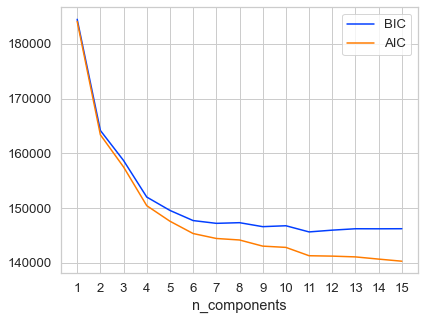

In [78]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
#test difference in 
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_gmm)
          for n in n_components]

bic_values = [m.bic(df_gmm) for m in models]
aic_values = [m.aic(df_gmm) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [79]:
# create final labels with 4 clusters

gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_gmm)

<a class="anchor" id="6.4.1.2"> 

#### 6.4.1.2 Value View
    
</a>

In [80]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

df_gmm_val =  df_values.copy()

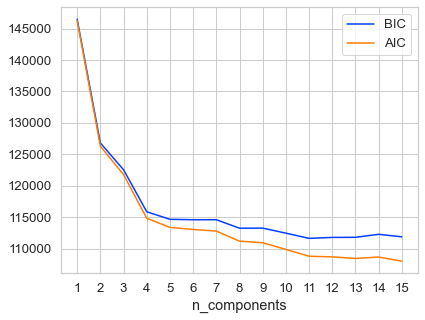

In [81]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
#test difference in 
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_gmm_val)
          for n in n_components]

bic_values = [m.bic(df_gmm_val) for m in models]
aic_values = [m.aic(df_gmm_val) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [82]:
# create final labels with 4 clusters
gmm_val = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_val_labels = gmm_val.fit_predict(df_gmm_val)

---
<a class="anchor" id="6.5">
    
## 6.5 Self Organizing Maps   

 </a>

<a class="anchor" id="6.5.1"> 
    
### 6.5.1 Self Organizing Maps - Direct 

</a>

<a class="anchor" id="6.5.1.1"> 
    
#### 6.5.1.1 All metrical variables 
    
</a>

In [83]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

data_som = metric_preprocessed_scaled.copy()
data_som.set_index(data_som.index.astype(int), inplace=True)

In [84]:
# training two different maps (small grid, large grid)

np.random.seed(42)
# train small grid
sm_small = sompy.SOMFactory().build(
    data_som.values, 
    mapsize=[10, 10],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som
)
sm_small.train(n_job=1, verbose=0, train_rough_len=100, train_finetune_len=100)
# train large grid
sm_large = sompy.SOMFactory().build(
    data_som.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som
)
sm_large.train(n_job=-1, verbose=0, train_rough_len=100, train_finetune_len=100)

Text(0, 0.5, 'Silhouette scores')

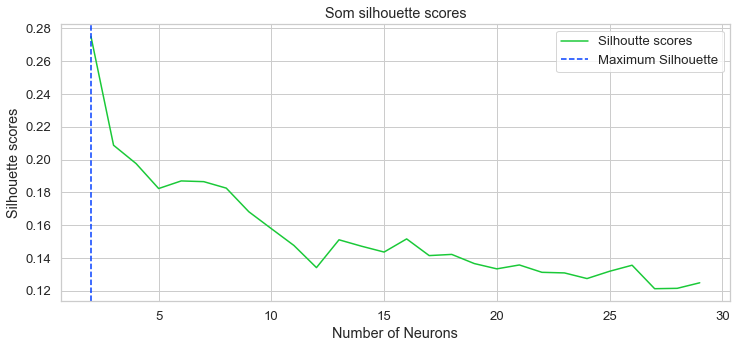

In [85]:
# plot silhouette score
processed_data=np.array(data_som)
n_clusters=list(range(2,30))
silhouette_scores=[]
# loop over different clusters sizes
for n_cluster in n_clusters :
    som_shape = (1, n_cluster)
    som = MiniSom(som_shape[0], som_shape[1], processed_data.shape[1], sigma=.5, learning_rate=.5,
                neighborhood_function='gaussian', random_seed=np.random.seed(42))

    som.random_weights_init(processed_data)
    som.train_batch(processed_data, 500, verbose=False)

    # each neuron represents a cluster
    winner_coordinates = np.array([som.winner(x) for x in processed_data]).T
    
    # with np.ravel_multi_index we convert the bidimensional
    # coordinates to a monodimensional index
    cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)
    # append silhouette score
    silhouette_scores.append(silhouette_score(processed_data,cluster_index))
# build plot
plt.figure(figsize=(12,5))
sns.lineplot(x=n_clusters,y=silhouette_scores,color='g').set(title='Som silhouette scores')
Y=max(silhouette_scores)
X=silhouette_scores.index(Y)+2
plt.axvline(X, 0, Y+1, linestyle='dashed',)
plt.legend(['Silhoutte scores','Maximum Silhouette'])
plt.xlabel('Number of Neurons')
plt.ylabel('Silhouette scores')

In [86]:
# Train best solution 

sm_best = sompy.SOMFactory().build(
    data_som.values, 
    mapsize=[1, 2],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som
)
sm_best.train(n_job=1, verbose=0, train_rough_len=100, train_finetune_len=100)

In [87]:
# create final labels
nodes = sm_best.codebook.matrix

df_nodes = data_som.copy()
df_nodes['label'] = sm_best.find_bmu(data_som)[0].astype(int).tolist()

som_labels = np.array(df_nodes.label)

<a class="anchor" id="6.5.1.2"> 
    
#### 6.5.1.2 Value View

</a>

In [88]:
# Prepare a copy of a dataframe for the cluster method
# scaled and metric data

data_som_val = df_values.copy()
data_som_val.set_index(data_som_val.index.astype(int), inplace=True)

In [89]:
# training two different maps (small grid, large grid)

np.random.seed(42)
# train small grid
sm_small_val = sompy.SOMFactory().build(
    data_som_val.values, 
    mapsize=[10, 10],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som_val
)
sm_small_val.train(n_job=1, verbose=0, train_rough_len=100, train_finetune_len=100)
# train large grid
sm_large_val = sompy.SOMFactory().build(
    data_som_val.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som_val
)
sm_large_val.train(n_job=-1, verbose=0, train_rough_len=100, train_finetune_len=100)

Text(0, 0.5, 'Silhouette scores')

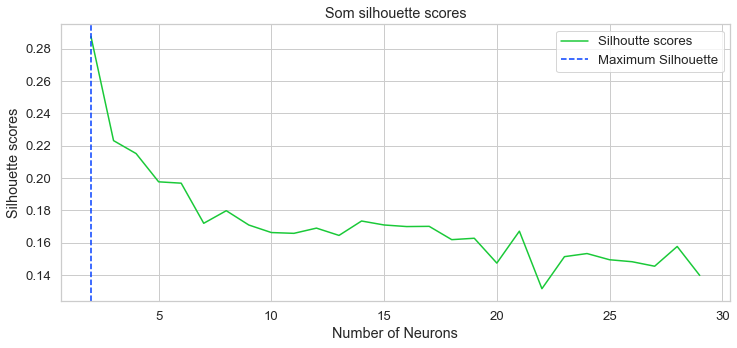

In [90]:
# plot silhouette score
processed_data=np.array(data_som_val)
n_clusters=list(range(2,30))
silhouette_scores=[]
# loop over different clusters sizes
for n_cluster in n_clusters :
    som_shape = (1, n_cluster)
    som = MiniSom(som_shape[0], som_shape[1], processed_data.shape[1], sigma=.5, learning_rate=.5,
                neighborhood_function='gaussian', random_seed=np.random.seed(42))

    som.random_weights_init(processed_data)
    som.train_batch(processed_data, 500, verbose=False)

    # each neuron represents a cluster
    winner_coordinates = np.array([som.winner(x) for x in processed_data]).T
    
    # with np.ravel_multi_index we convert the bidimensional
    # coordinates to a monodimensional index
    cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)
    # append silhouette score
    silhouette_scores.append(silhouette_score(processed_data,cluster_index))
# build plot
plt.figure(figsize=(12,5))
sns.lineplot(x=n_clusters,y=silhouette_scores,color='g').set(title='Som silhouette scores')
Y=max(silhouette_scores)
X=silhouette_scores.index(Y)+2
plt.axvline(X, 0, Y+1, linestyle='dashed',)
plt.legend(['Silhoutte scores','Maximum Silhouette'])
plt.xlabel('Number of Neurons')
plt.ylabel('Silhouette scores')

In [91]:
# Train best solution (value perspective)

sm_best_val = sompy.SOMFactory().build(
    data_som_val.values, 
    mapsize=[1, 2],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=data_som
)
sm_best_val.train(n_job=1, verbose=0, train_rough_len=100, train_finetune_len=100)

In [92]:
# create final labels (value perspective)
nodes_val = sm_best_val.codebook.matrix

df_nodes_val = data_som_val.copy()

df_nodes_val['label'] = sm_best_val.find_bmu(data_som_val)[0].astype(int).tolist()

som_val_labels = np.array(df_nodes_val.label)

<a class="anchor" id="6.5.2"> 

### 6.5.2 Emergent SOM + KMeans Clustering 

</a>

<a class="anchor" id="6.5.2.1"> 
    
#### 6.5.2.1 All metrical variables

</a>

In [93]:
# calculate r-squared and silhouette score for range of cluster sizes
range_clusters = range(1, 11)
# create lists to append score to
inertia = []
avg_silhouette = []
# loop over different cluster sizes and append scores
for n_clus in range_clusters: 
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(sm_large.codebook.matrix)
    # r-squared score = inertia_
    inertia.append(kmclust.inertia_)
    # silhouette score
    if n_clus == 1:
        continue
    cluster_labels = kmclust.fit_predict(sm_large.codebook.matrix)
    silhouette_avg = silhouette_score(sm_large.codebook.matrix, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    

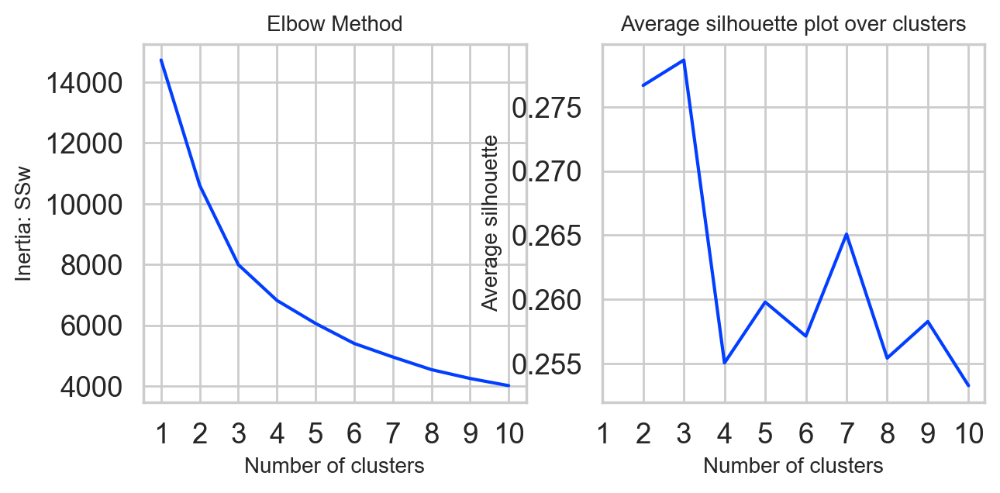

In [94]:
# plot elbow chart and silhouette score
cluster_plots(sm_large.codebook.matrix)

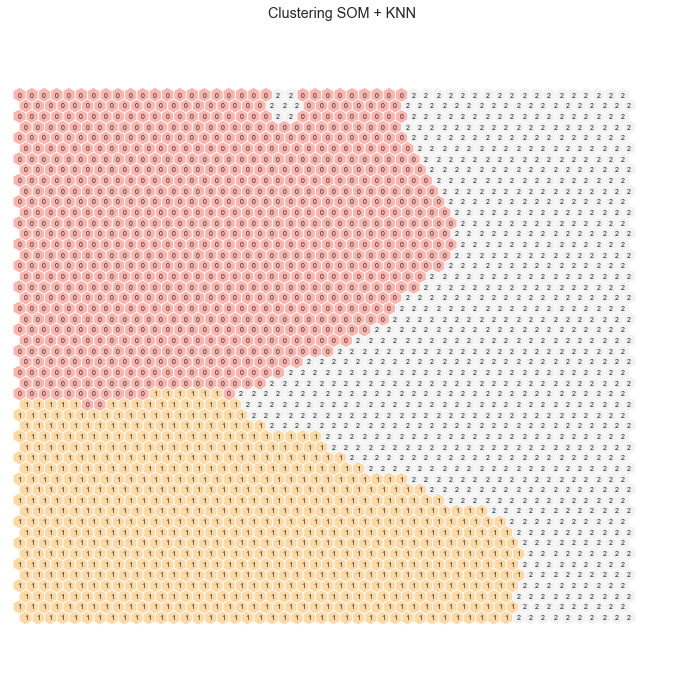

In [95]:
# set up clustering algorithm with 3 clusters
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=20, random_state=42)
nodeclus_labels_knn = kmeans.fit_predict(sm_large.codebook.matrix)
sm_large.cluster_labels = nodeclus_labels_knn  # setting the cluster labels of sompy

# plot hitmap
hits = HitMapView(12, 12,"Clustering SOM + KNN", text_size=10)
hits.show(sm_large, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [96]:
# create final labels
nodes = sm_large.codebook.matrix
df_nodes = pd.DataFrame(nodes, columns=list(data_som.columns))
df_nodes['label'] = nodeclus_labels_knn

# Obtaining SOM's BMUs labels (BestMatchingUnit)
bmus_map = sm_large.find_bmu(data_som)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((data_som, np.expand_dims(bmus_map,1)), axis=1),
    index=data_som.index, columns=np.append(data_som.columns,"BMU")
)

df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)

In [97]:
# final labels
som_kmeans_labels = np.array(df_final.label)

<a class="anchor" id="6.5.3"> 
    
### 6.5.3 Emergent SOM + Agglomerative Clustering

</a>

<a class="anchor" id="6.5.3.1"> 
    
#### 6.5.3.1 All metrical variables

</a>

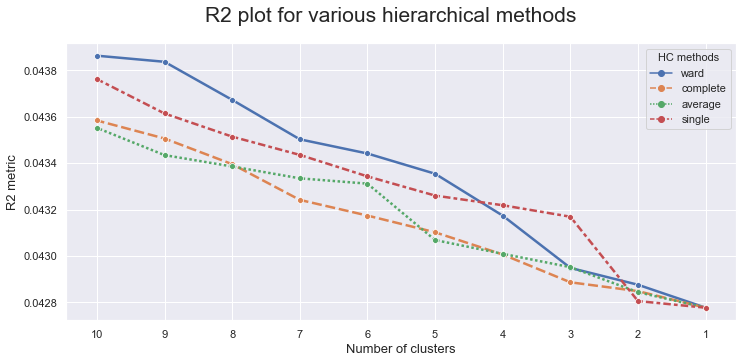

In [98]:
#choosing the right linkage
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=data_som, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T

r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
fig = plt.figure(figsize=(12,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [99]:
# train algorithm with best linkage
# using "single" resulted in bad interpretable results, that's why we chose the second best - "ward"

linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(data_som)

array([7451, 9645, 6867, ...,    1,    2,    0], dtype=int64)

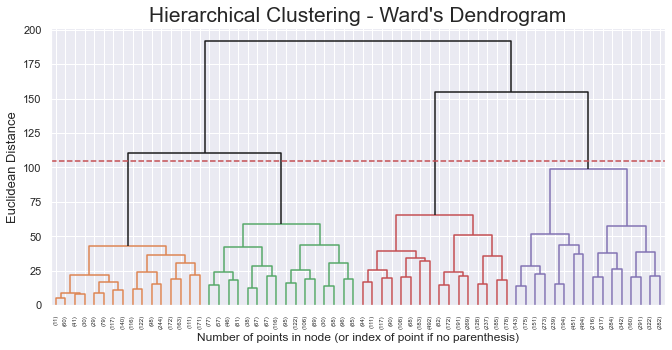

In [100]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)


for i, merge in enumerate(hclust.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # leaf node
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

sns.set()
fig = plt.figure(figsize=(11,5))

y_threshold = 105
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

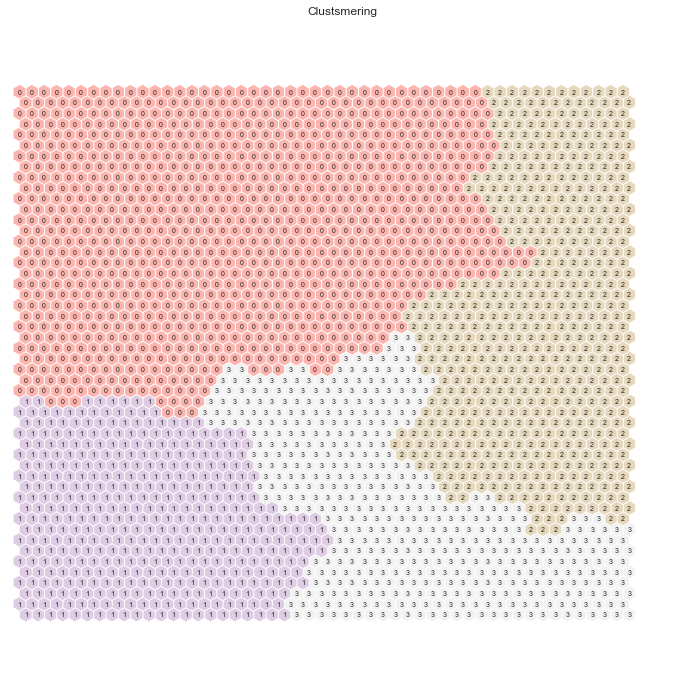

In [101]:
# set up clustering algorithm with 3 clusters
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels_hir = hierclust.fit_predict(sm_large.codebook.matrix)
sm_large.cluster_labels = nodeclus_labels_hir  # setting the cluster labels of sompy

# plot hitmap
hits  = HitMapView(12, 12,"Clustsmering",text_size=10)
hits.show(sm_large, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [102]:
# create final labels
nodes = sm_large.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=list(data_som.columns))
df_nodes['label'] = nodeclus_labels_hir
df_nodes

# Obtaining SOM's BMUs labels (BestMatchingUnit)
bmus_map = sm_large.find_bmu(data_som)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((data_som, np.expand_dims(bmus_map,1)), axis=1),
    index=data_som.index, columns=np.append(data_som.columns,"BMU")
)

df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)

In [103]:
# final labels
som_hier_labels = np.array(df_final.label)

<a class="anchor" id="6.5.4"> 

### 6.5.4 Emergent SOM + KMeans Clustering 

</a>

<a class="anchor" id="6.5.4.1"> 

#### 6.5.4.1 Value View 

</a>

In [104]:
# calculate r-squared and silhouette score for range of cluster sizes
range_clusters = range(1, 11)
# create lists to append score to
inertia_val = []
avg_silhouette = []
# loop over different cluster sizes and append scores
for n_clus in range_clusters: 
    kmclust_val = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust_val.fit(sm_large_val.codebook.matrix)
    # r-squared score = inertia_
    inertia_val.append(kmclust_val.inertia_)
    # silhouette score
    if n_clus == 1:
        continue
    cluster_labels_val = kmclust.fit_predict(sm_large_val.codebook.matrix)
    silhouette_avg_val = silhouette_score(sm_large_val.codebook.matrix, cluster_labels_val)
    avg_silhouette.append(silhouette_avg_val)
    

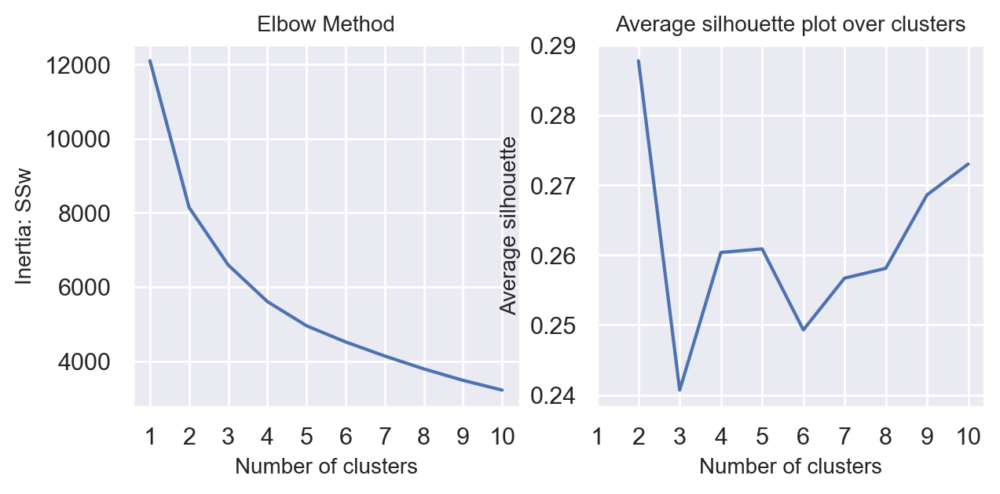

In [105]:
# plot elbow chart and silhouette score
cluster_plots(sm_large_val.codebook.matrix)

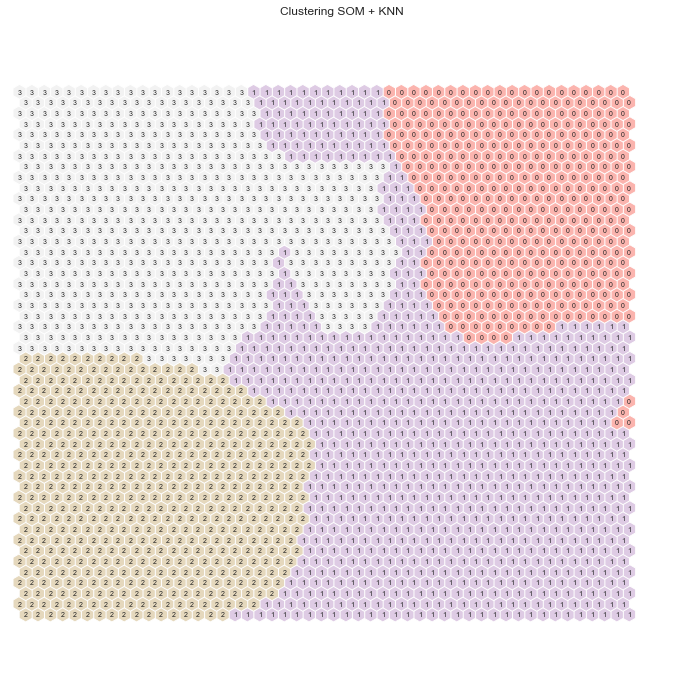

In [106]:
# set up clustering algorithm with 3 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels_knn_val = kmeans.fit_predict(sm_large_val.codebook.matrix)
sm_large_val.cluster_labels = nodeclus_labels_knn_val  # setting the cluster labels of sompy

# plot hitmap
hits = HitMapView(12, 12,"Clustering SOM + KNN", text_size=10)
hits.show(sm_large_val, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [107]:
# create final labels

nodes_val = sm_large_val.codebook.matrix

df_nodes_val = pd.DataFrame(nodes_val, columns=list(data_som_val.columns))
df_nodes_val['label'] = nodeclus_labels_knn_val
#ist das richtig?

# Obtaining SOM's BMUs labels (BestMatchingUnit)
bmus_map_val = sm_large_val.find_bmu(data_som_val)[0]  # get bmus for each observation in df

df_bmus_val = pd.DataFrame(
    np.concatenate((data_som_val, np.expand_dims(bmus_map_val,1)), axis=1),
    index=data_som_val.index, columns=np.append(data_som_val.columns,"BMU")
)

df_final_val = df_bmus_val.merge(df_nodes_val['label'], 'left', left_on="BMU", right_index=True)

In [108]:
# final labels
som_kmeans_val_labels = np.array(df_final_val.label)

<a class="anchor" id="6.5.5"> 
    
### 6.5.5 Emergent SOM + Agglomerative Clustering

</a>

<a class="anchor" id="6.5.5.1"> 
    
#### 6.5.5.1 Value View

</a>

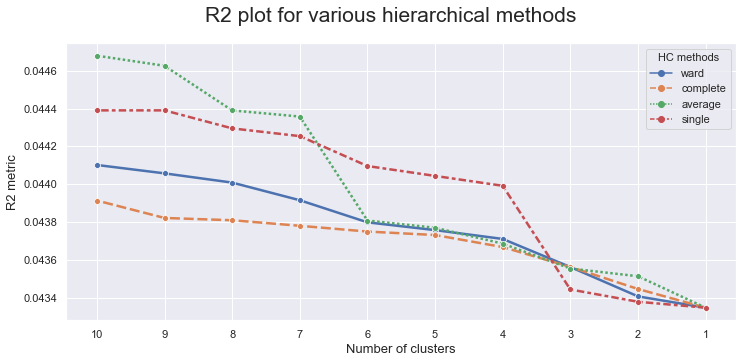

In [109]:
#choosing the right linkage
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=data_som_val, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T

r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
fig = plt.figure(figsize=(12,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [110]:
# train algorithm with best linkage
# using "single" resulted in bad interpretable results, that's why we chose the second best - "ward"

linkage = 'ward'
distance = 'euclidean'
hclust_val = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust_val.fit_predict(data_som_val)

array([7859, 5004, 8789, ...,    6,    2,    0], dtype=int64)

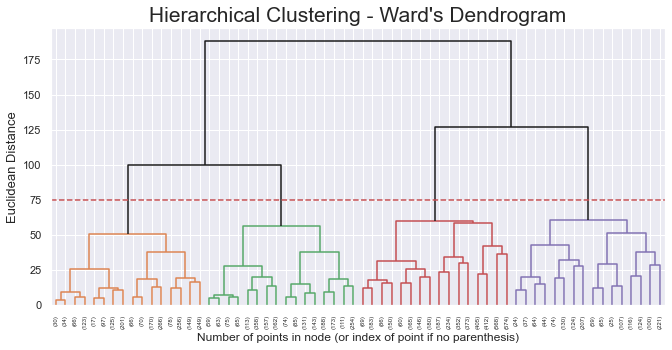

In [111]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

counts = np.zeros(hclust_val.children_.shape[0])
n_samples = len(hclust_val.labels_)


for i, merge in enumerate(hclust_val.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # leaf node
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack(
    [hclust_val.children_, hclust_val.distances_, counts]
).astype(float)

sns.set()
fig = plt.figure(figsize=(11,5))

y_threshold = 75
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

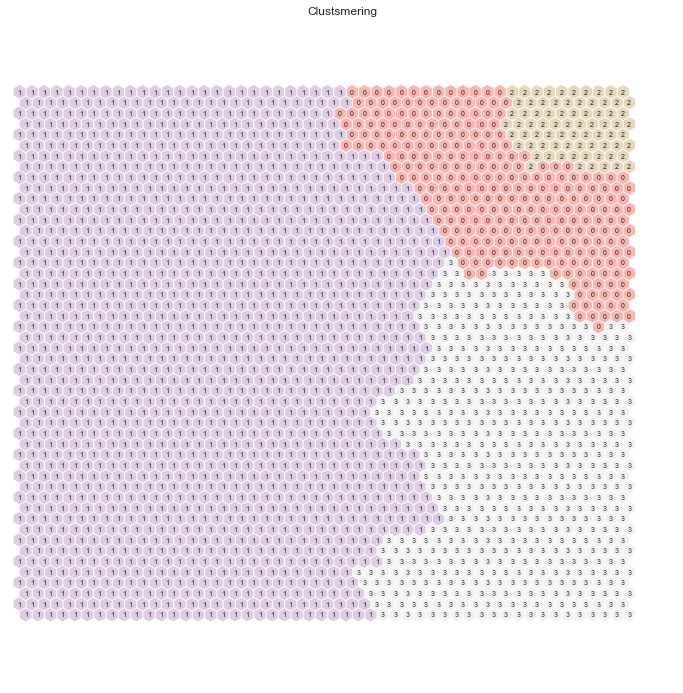

In [112]:
# set up clustering algorithm with 3 clusters
hierclust = AgglomerativeClustering(n_clusters=4, linkage='average')
nodeclus_labels_hir_val = hierclust.fit_predict(sm_large_val.codebook.matrix)
sm_large_val.cluster_labels = nodeclus_labels_hir_val # setting the cluster labels of sompy

# plot hitmap
hits  = HitMapView(12, 12,"Clustsmering",text_size=10)
hits.show(sm_large_val, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [113]:
# create final labels
nodes_val = sm_large_val.codebook.matrix

df_nodes_val = pd.DataFrame(nodes_val, columns=list(data_som_val.columns))
df_nodes_val['label'] = nodeclus_labels_hir_val
df_nodes_val

# Obtaining SOM's BMUs labels (BestMatchingUnit)
bmus_map_val = sm_large_val.find_bmu(data_som_val)[0]  # get bmus for each observation in df

df_bmus_val = pd.DataFrame(
    np.concatenate((data_som_val, np.expand_dims(bmus_map,1)), axis=1),
    index=data_som_val.index, columns=np.append(data_som_val.columns,"BMU")
)

df_final_val = df_bmus_val.merge(df_nodes_val['label'], 'left', left_on="BMU", right_index=True)

In [114]:
# final labels
som_hier_val_labels = np.array(df_final_val.label)

---
<a class="anchor" id="7"> 
    
# 7. Model Assessment

 </a>

<a class="anchor" id="7.1"> 
    
## 7.1 Comparing R-squares & Silhouette Score 

</a>

In [115]:
# list of the clustering labels (all features)
labels_all_features = [
    som_labels,
    som_hier_labels,
    som_kmeans_labels,
    gmm_labels,
    ms_labels,
    kmeans_labels,
    agg_labels]
# list of the clustering methods associated to the labels in the list above
labels_all_features_name = [
    "SOM",
    "SOM + Hierarchisch",
    "SOM + KMeans",
    "Gaussian Mixture",
    "Mean Shift",
    "KMeans",
    "Agglomerative"]
# copy of the list "lables_all_features_name"
# names of cluster methods are the same for value perspective
labels_p_val_name = labels_all_features_name.copy()
# list of the clustering labels (value view)
labels_p_val = [
    som_val_labels,
    som_hier_val_labels,
    som_kmeans_val_labels,
    gmm_val_labels,
    ms_val_labels,
    kmeans_val_labels,
    agg_val_labels]

# list containing the labels of KPrototypes
labels_p_dem = [kp_dem_labels]
# list with name. needed for visualization
labels_p_dem_name = ["KPrototype"]

#########################
#Dbscan all variables prepearation 
########################
labels_dbscan =[np.array(db_labels)]
dbscan_name=["Dbscan_all"]

df_scaled_db  = df_scaled.drop(index=db_outliers)

#########################
#Dbscan value prepearation 
########################

labels_dbscan_val = [np.array(db_val_labels)]

dbscan_val_name=["Dbscan_value"]

df_value_db =  df_values.drop(index=db_val_outliers)

# set up all the needed label lists as well as dataframes needed for visualizing r-squared an silhouette score
df_list = [
    df_scaled,
    df_values,
    df_demo, 
    df_scaled_db,
    df_value_db]

array_lists = [labels_all_features, labels_p_val, labels_p_dem, labels_dbscan, labels_dbscan_val]
label_lists = [labels_all_features_name, labels_p_val_name, labels_p_dem_name, dbscan_name, dbscan_val_name]

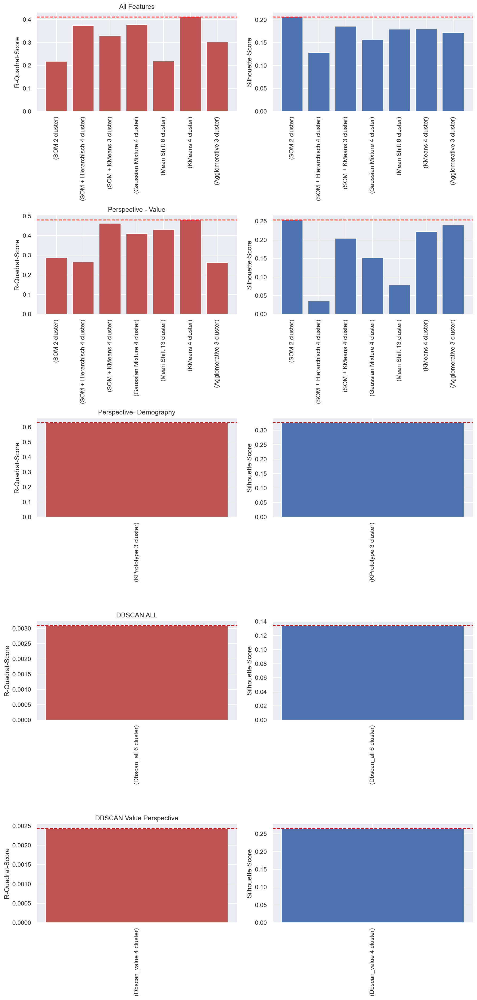

In [116]:
# plot clustering comparison
plot_scores(array_lists, df_list, label_lists)

---
<a class="anchor" id="7.2"> 
    
## 7.2 Inside analyses Perspective - All Features

 </a>



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



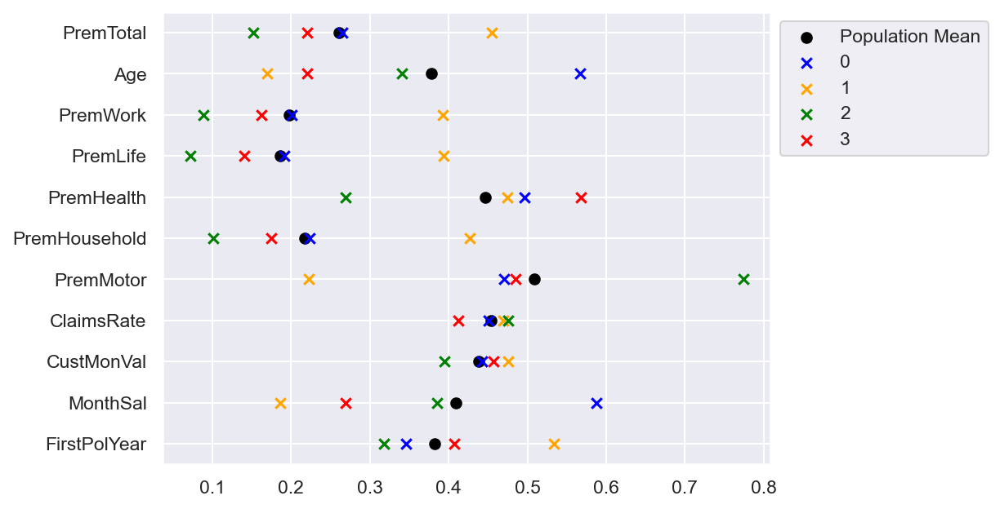



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



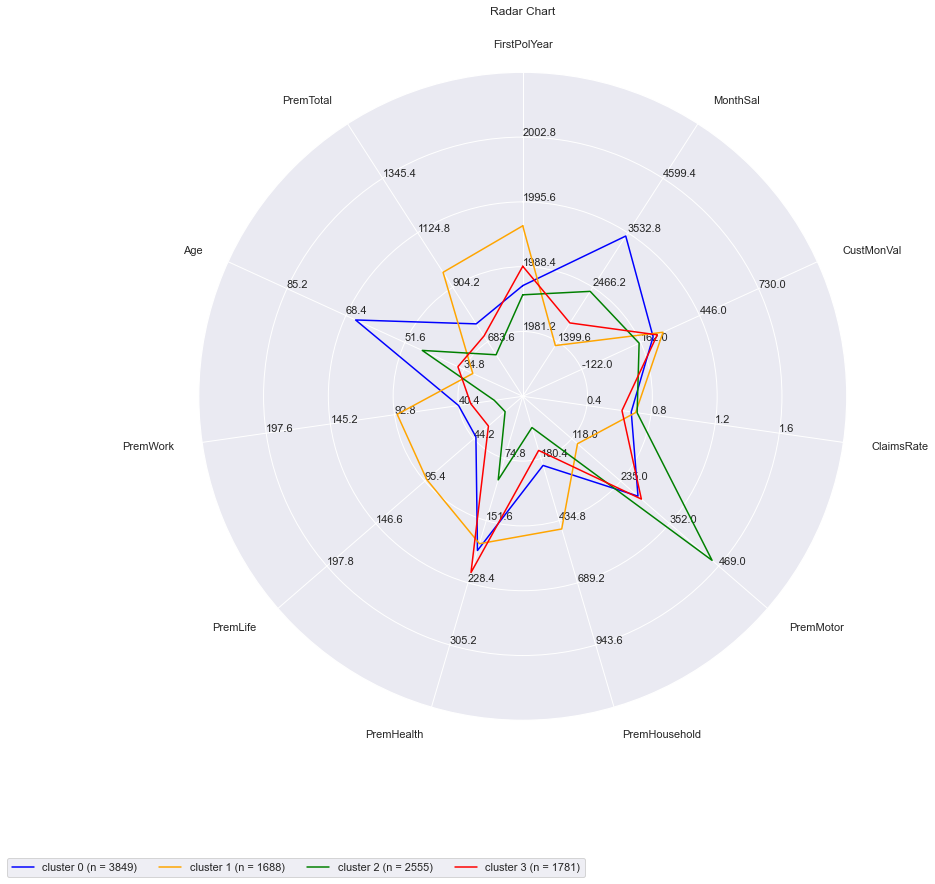

In [117]:
# plot cluster means vs population mean
# plot radarplot

# SOM + Hierarchisch
cluster_viz_report(df_all_unscaled, df_scaled, som_hier_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



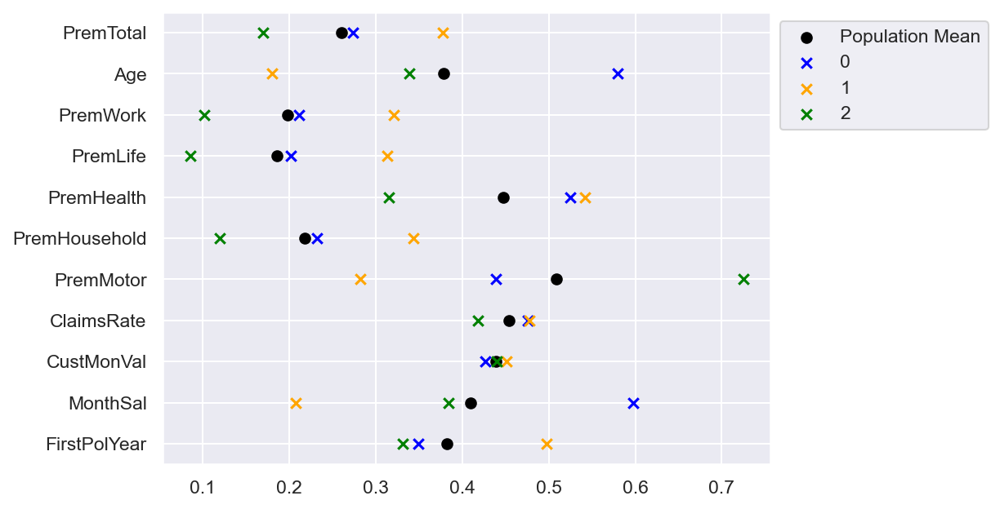



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



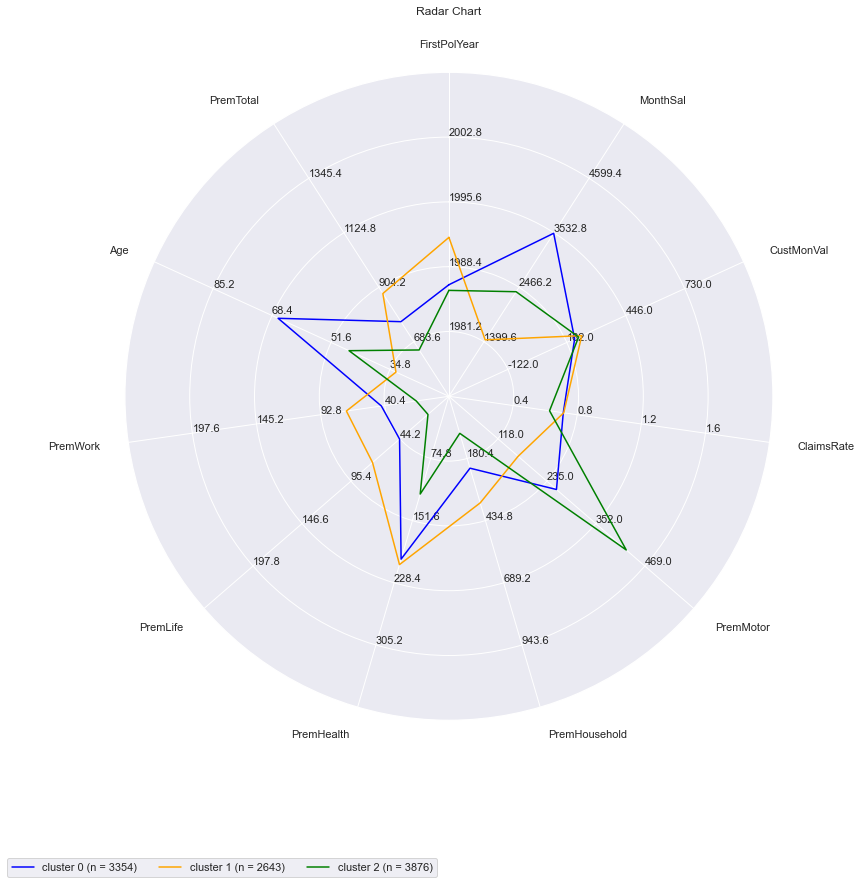

In [118]:
# plot cluster means vs population mean
# plot radarplot

# SOM + KMeans
cluster_viz_report(df_all_unscaled ,df_scaled, som_kmeans_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



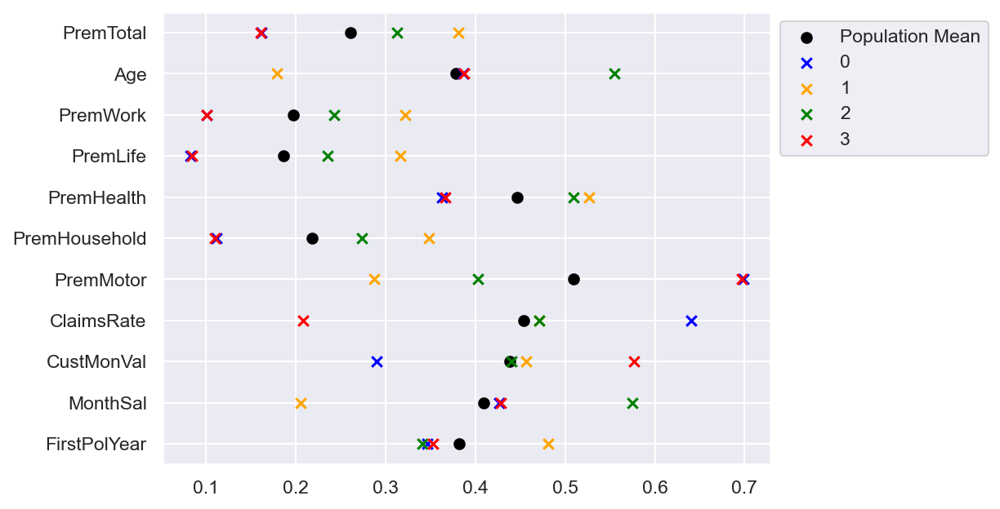



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



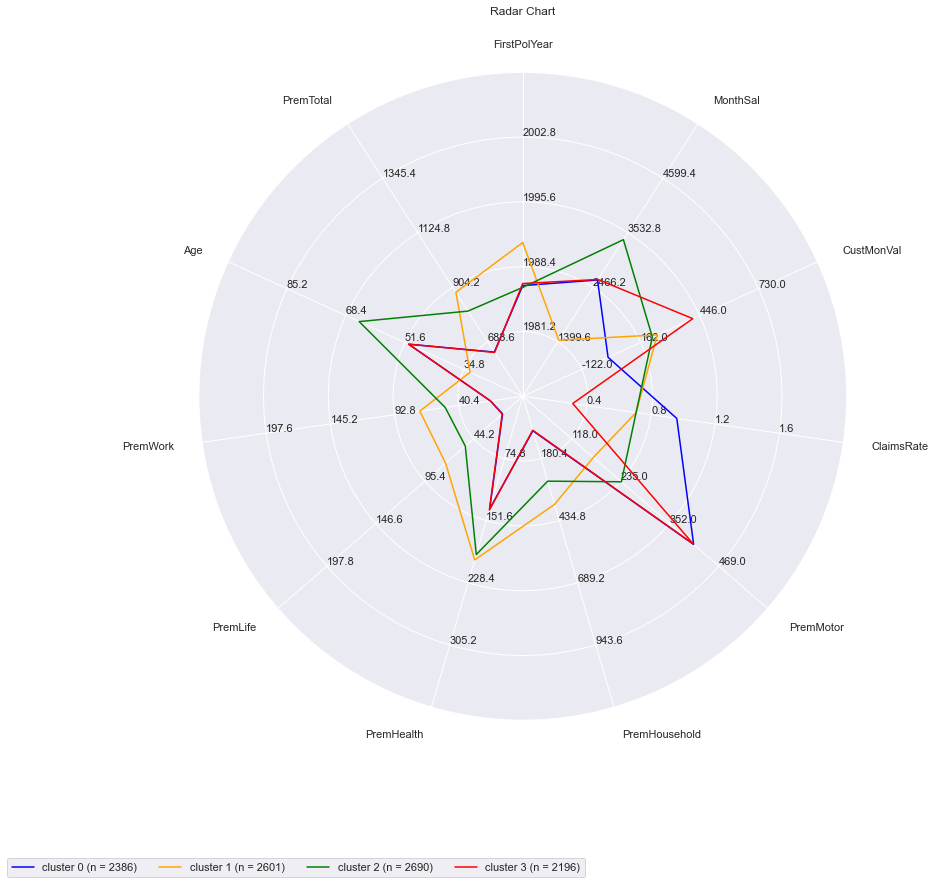

In [119]:
# plot cluster means vs population mean
# plot radarplot

# Gaussian Mixture
cluster_viz_report(df_all_unscaled ,df_scaled, gmm_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



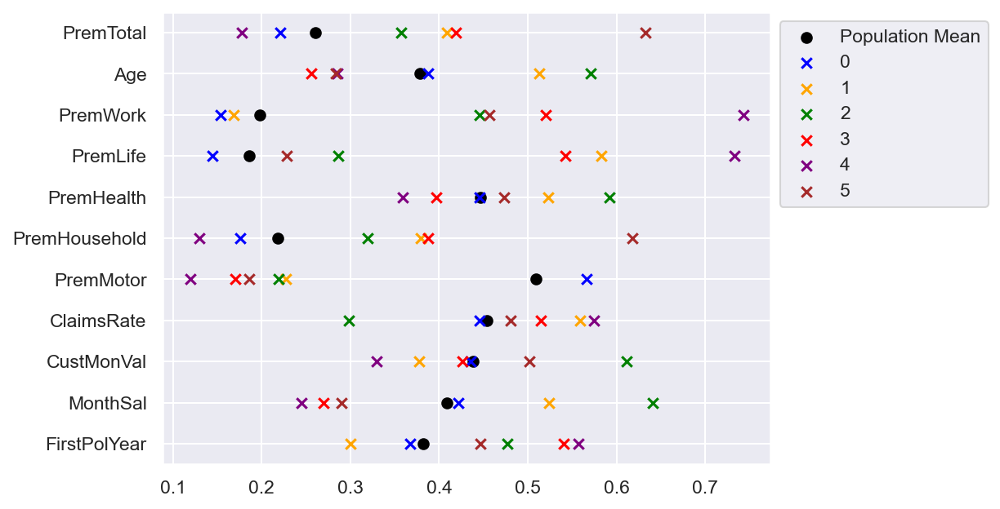



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



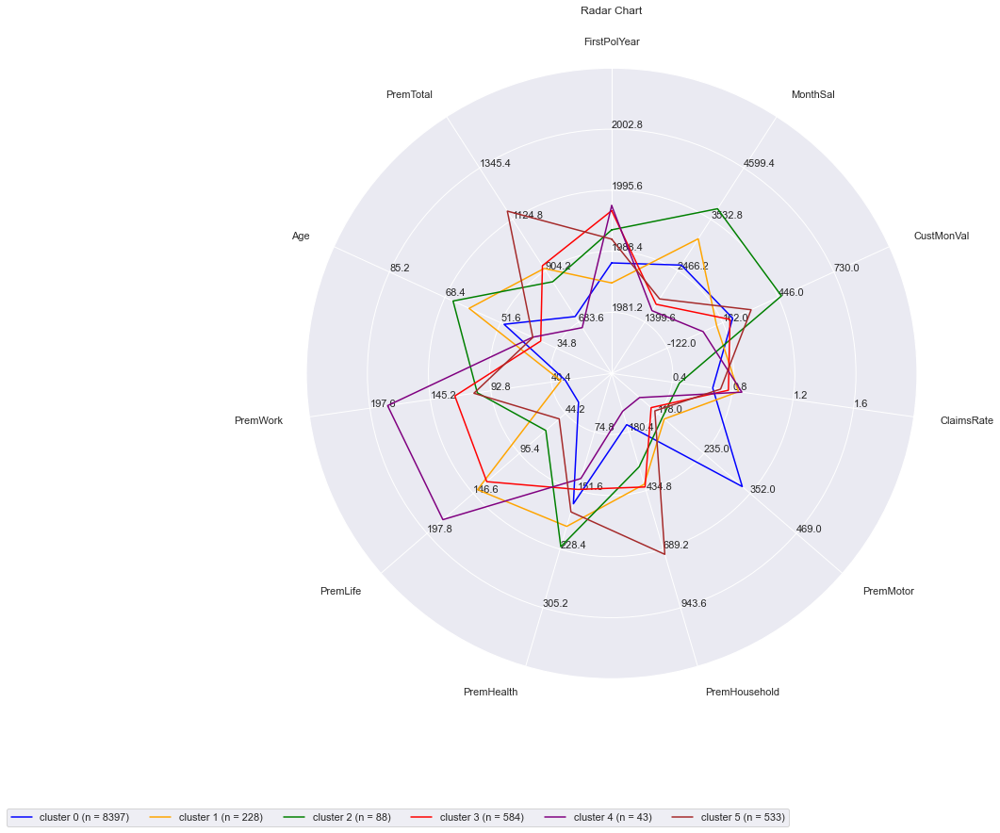

In [120]:
# plot cluster means vs population mean
# plot radarplot

# Mean Shift
cluster_viz_report(df_all_unscaled ,df_scaled, ms_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



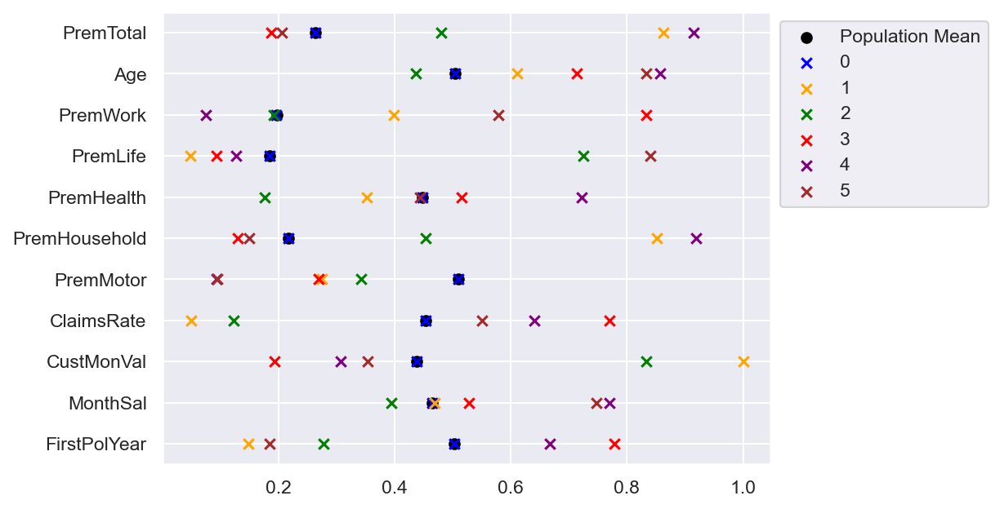



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



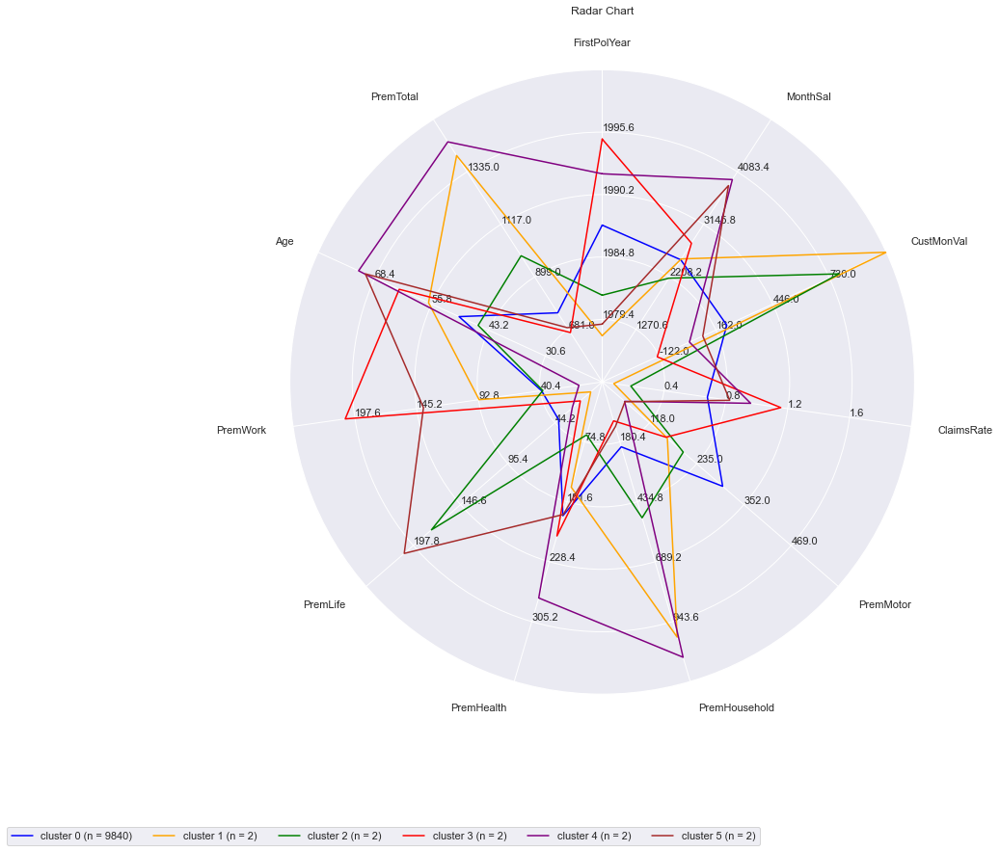

In [121]:
# DBSCAN
# plot cluster means vs population mean
# plot radarplot

# create needed scaled/unscaled dataframe for dbscan
# drop outliers
df_all_db_unscaled = df_all_unscaled.drop(index=db_outliers)

labels_dbscan = np.array(db_labels)

df_scaled_db =  df_scaled.drop(index=db_outliers)

# DBSCAN
cluster_viz_report(df_all_db_unscaled ,df_scaled_db, labels_dbscan, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



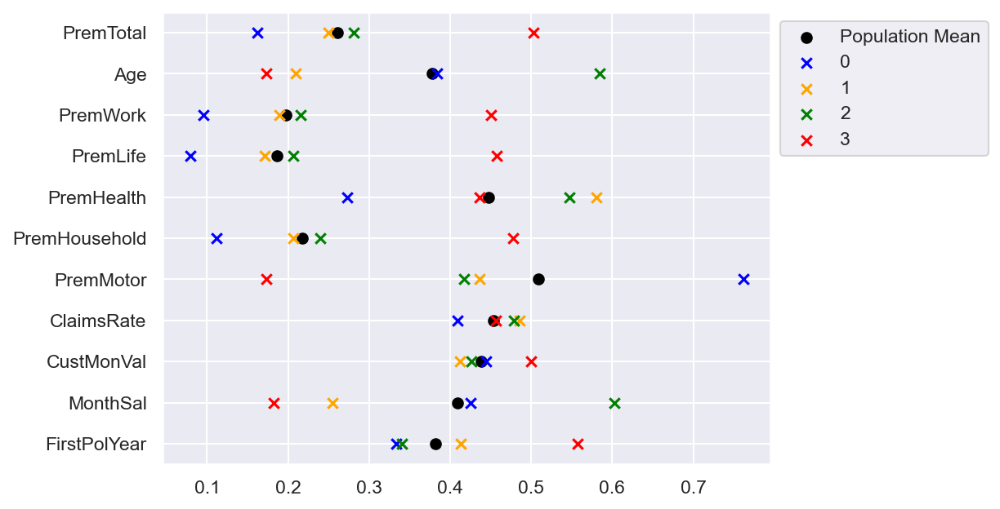



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



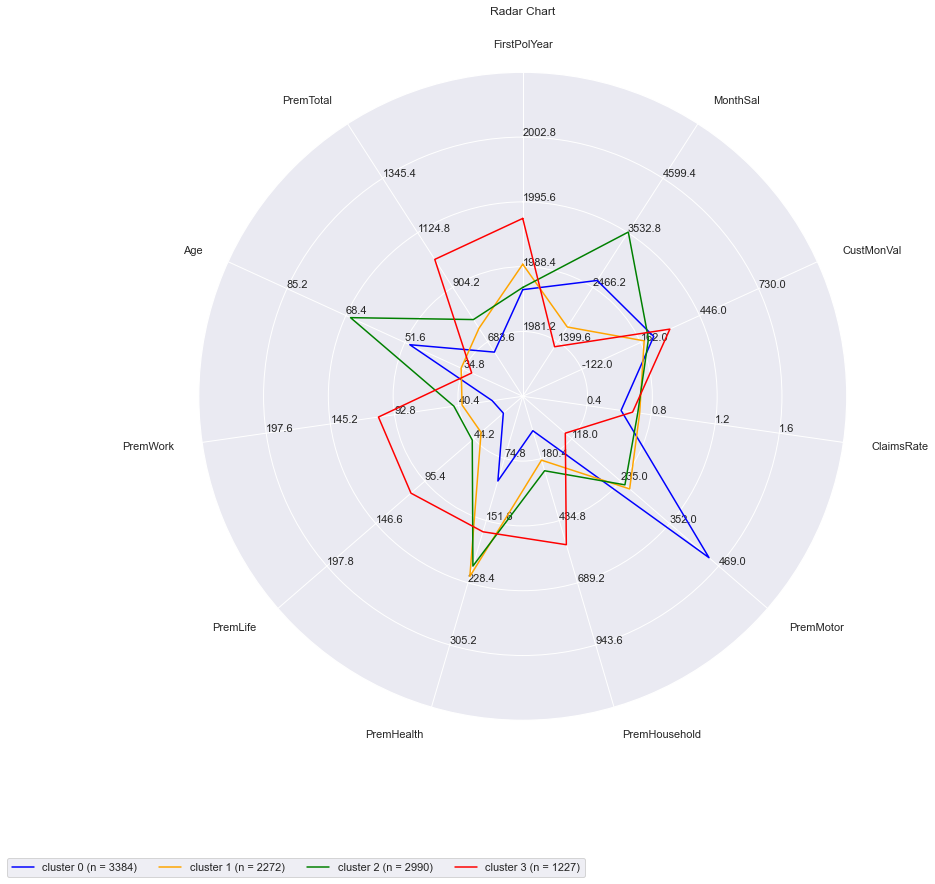

In [122]:
# plot cluster means vs population mean
# plot radarplot

# KMeans
cluster_viz_report(df_all_unscaled ,df_scaled, kmeans_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



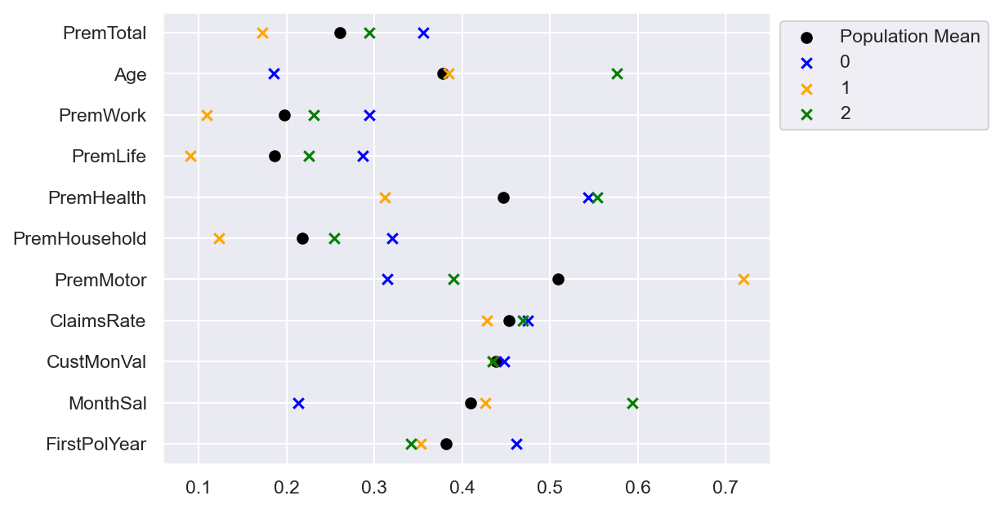



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



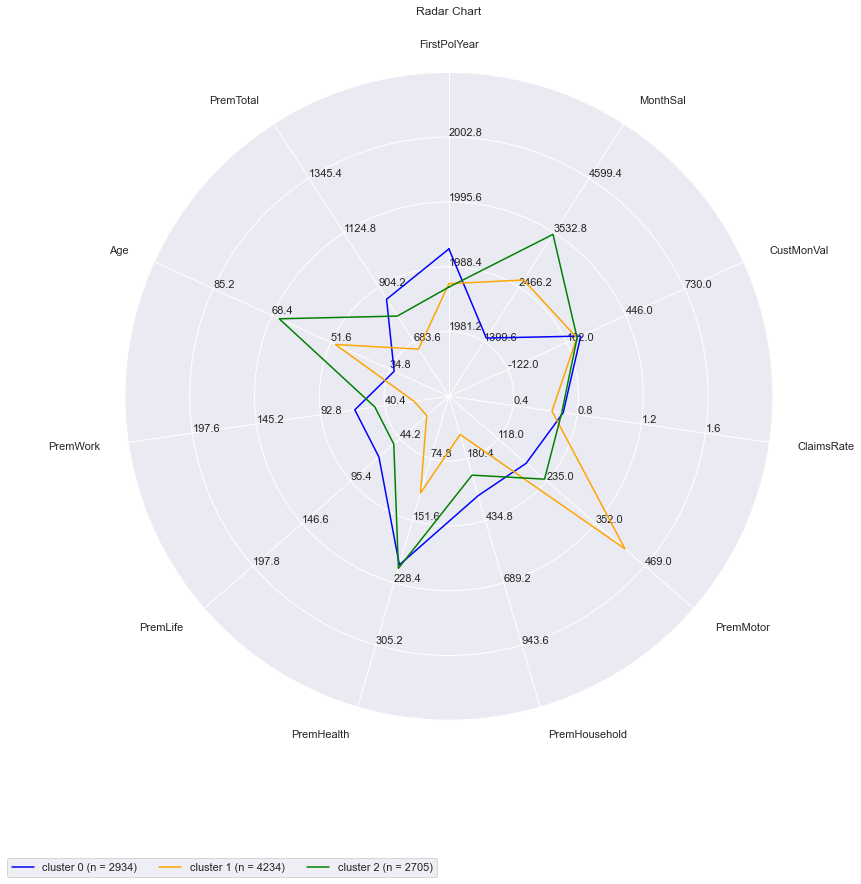

In [123]:
# plot cluster means vs population mean
# plot radarplot

# Agglomerative
cluster_viz_report(df_all_unscaled ,df_scaled, agg_labels, verbose=1)

<a class="anchor" id="7.3"> 
    
## 7.3 Inside analyses Perspective - Value   

</a>



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



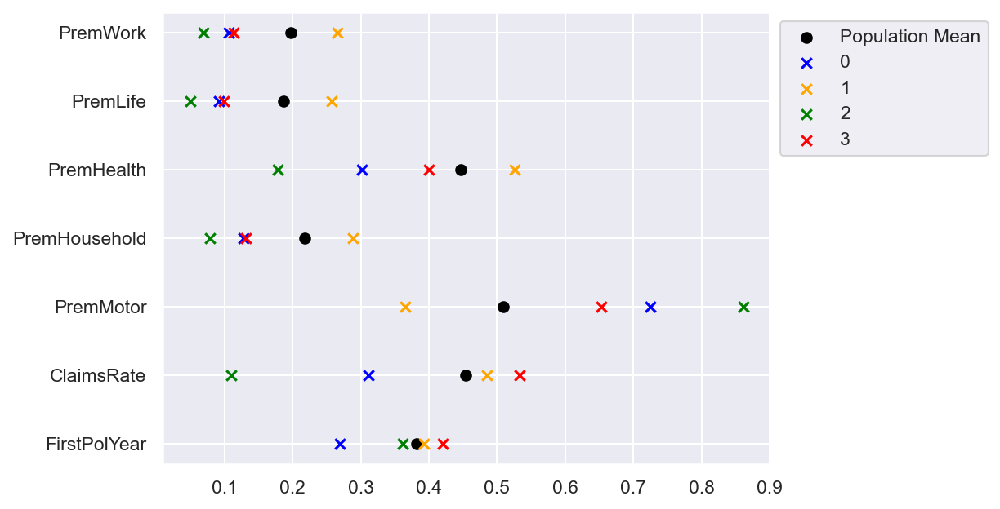



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



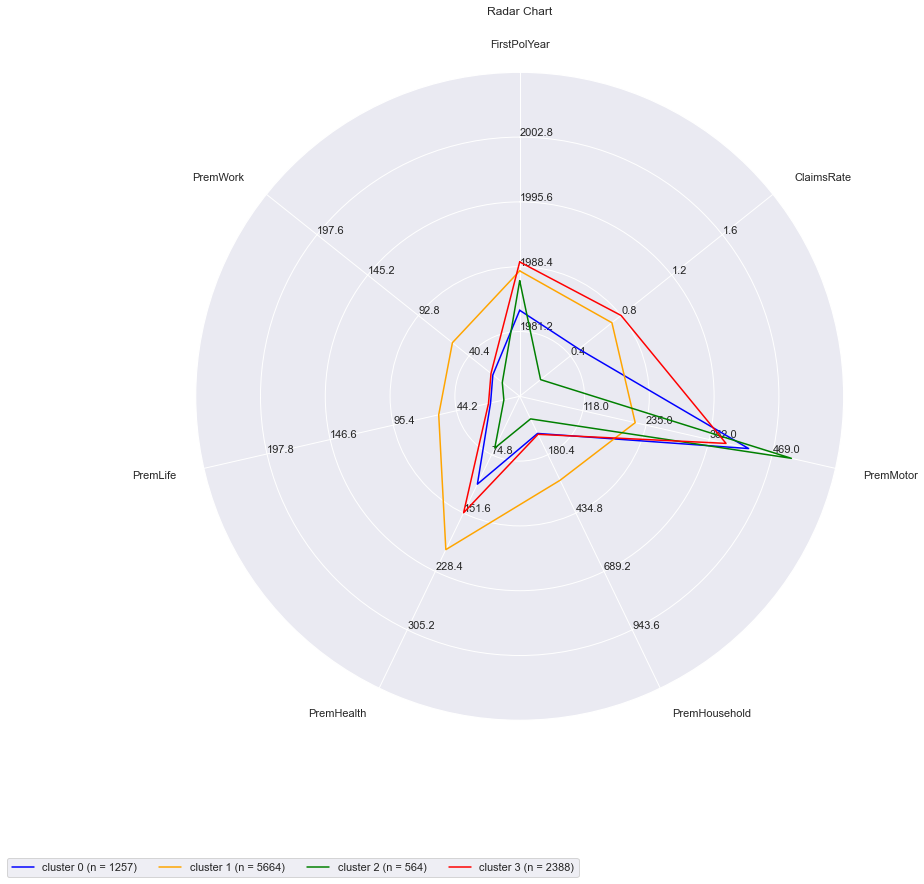

In [124]:
# plot cluster means vs population mean
# plot radarplot

# SOM + Hierarchisch
cluster_viz_report(df_values_unscaled , df_values, som_hier_val_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



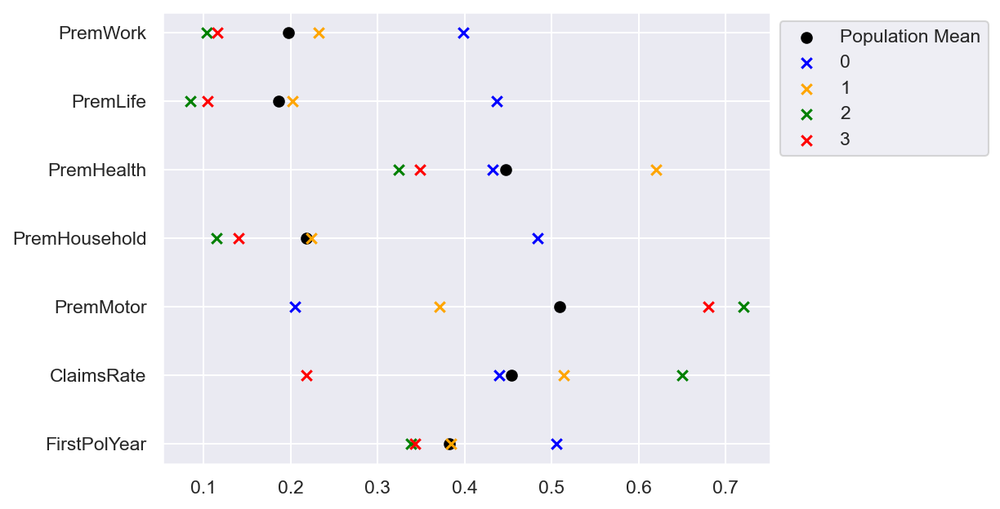



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



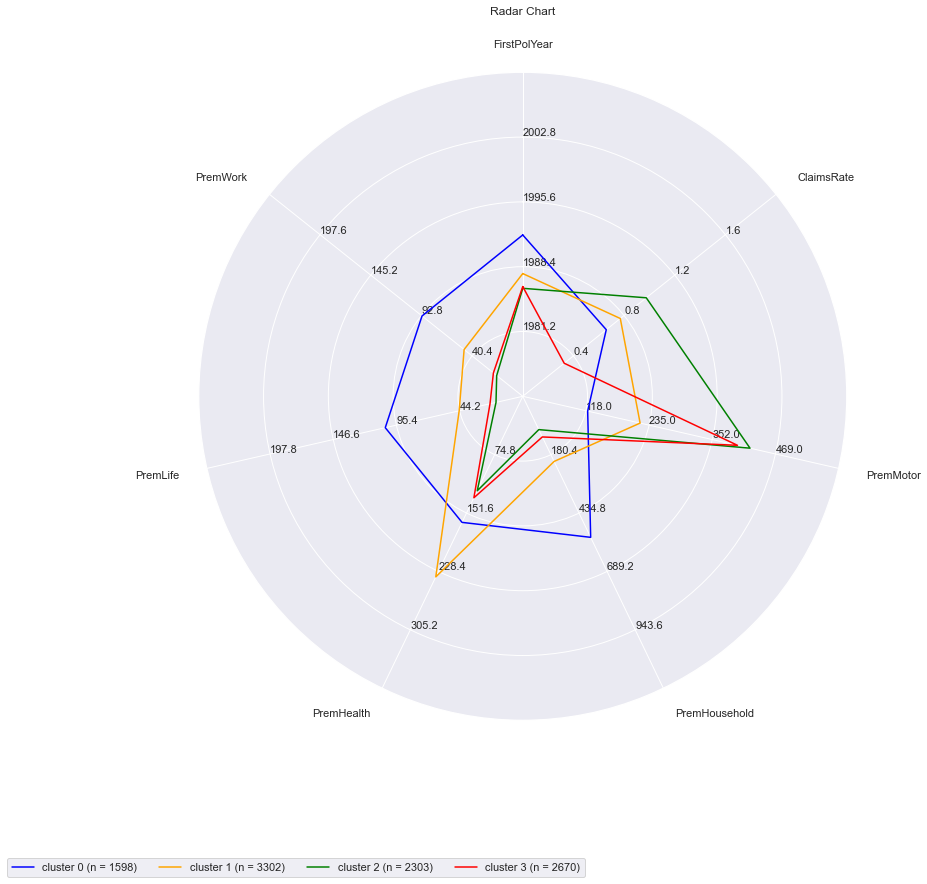

In [125]:
# plot cluster means vs population mean
# plot radarplot

# SOM + KMeans
cluster_viz_report(df_values_unscaled, df_values, som_kmeans_val_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



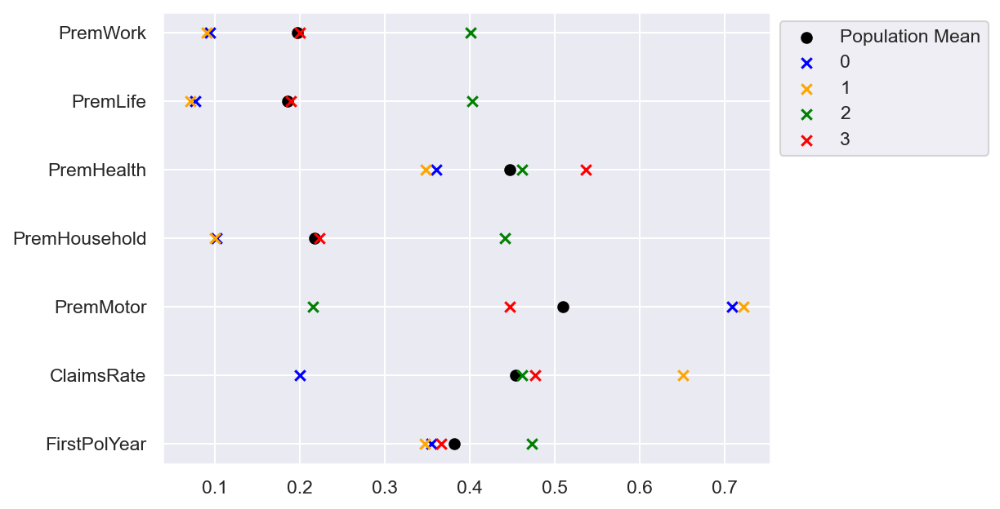



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



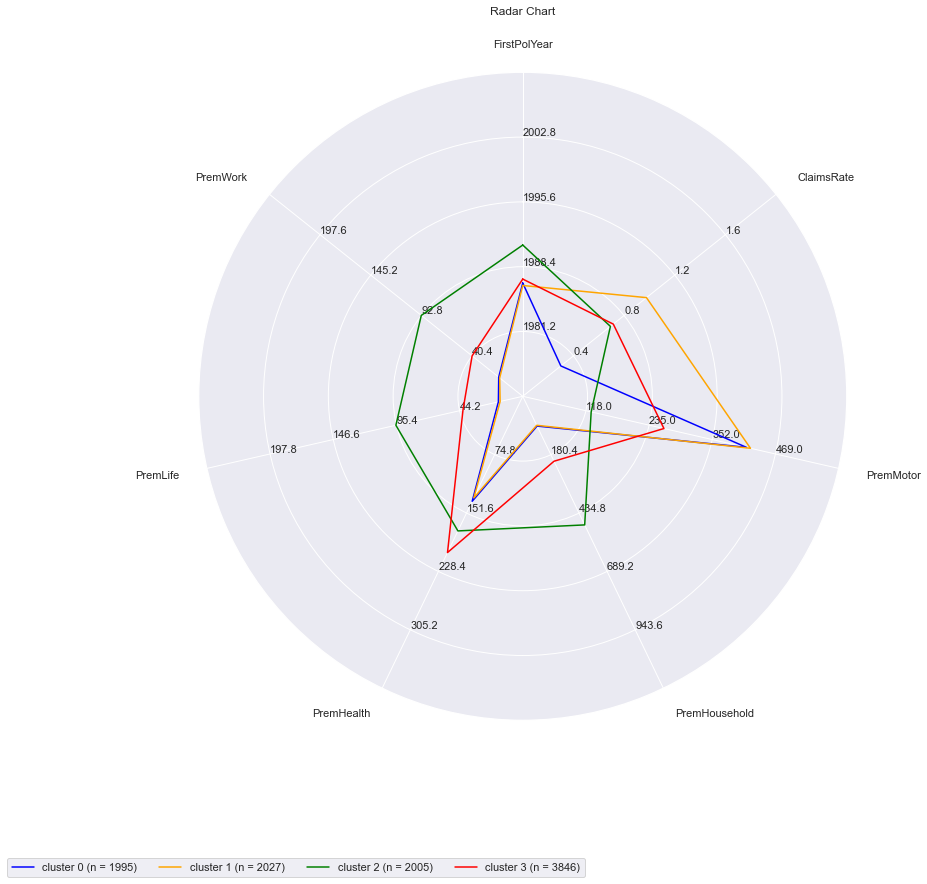

In [126]:
# plot cluster means vs population mean
# plot radarplot

# Gaussian Mixture
cluster_viz_report(df_values_unscaled , df_values, gmm_val_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



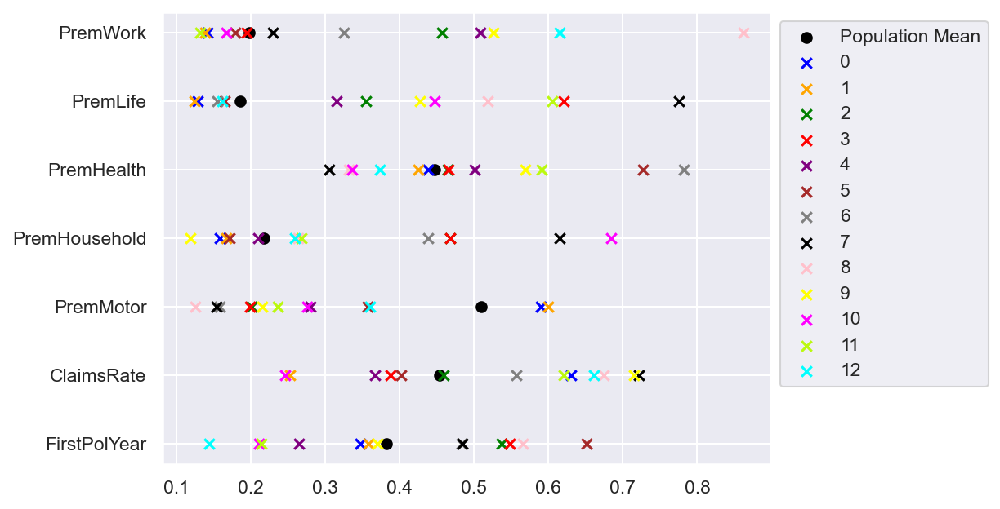



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



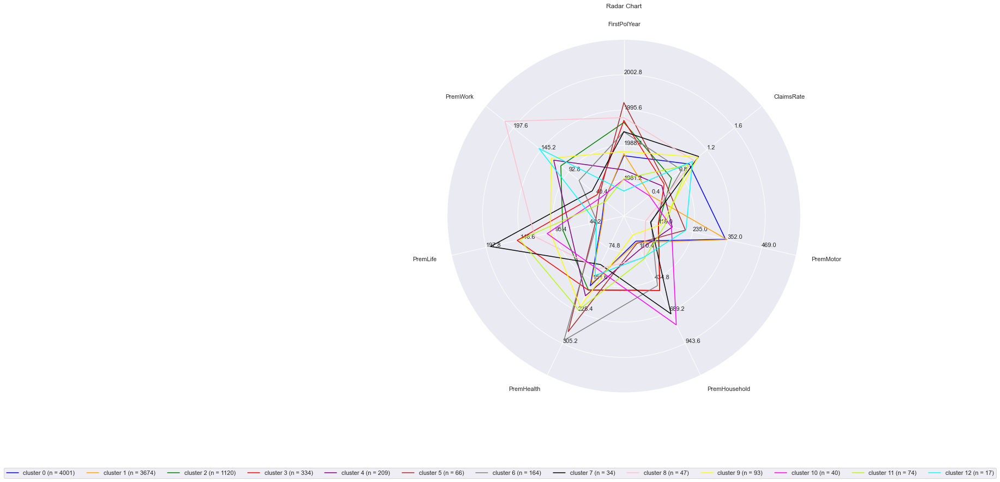

In [127]:
# plot cluster means vs population mean
# plot radarplot

# Mean Shift
cluster_viz_report(df_values_unscaled , df_values, ms_val_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



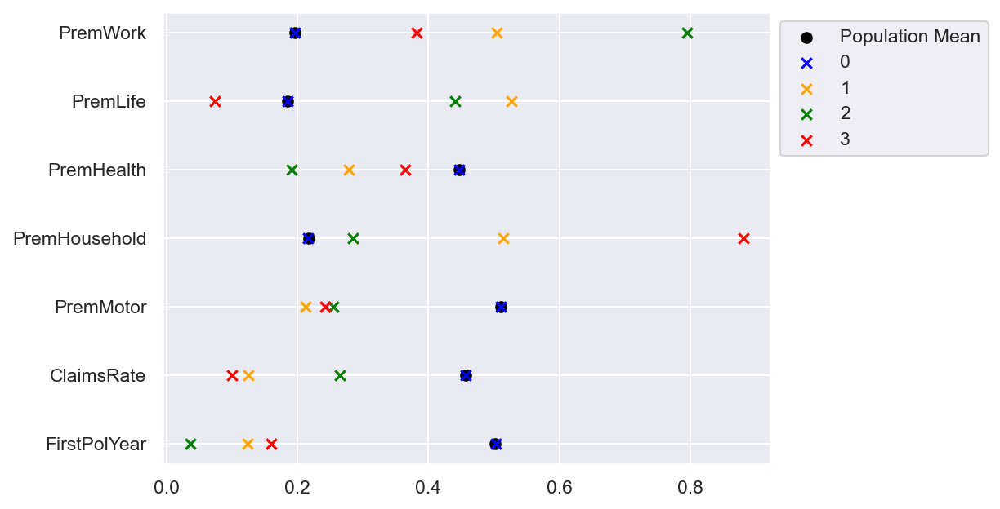



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



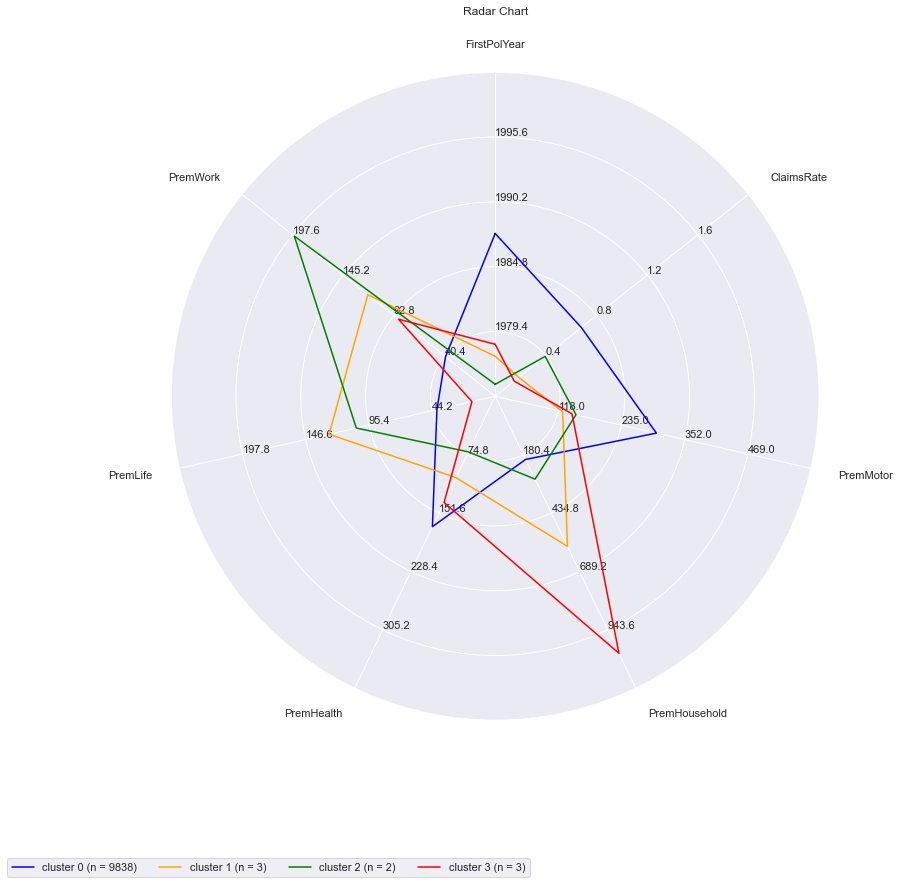

In [128]:
# DBScan
# plot cluster means vs population mean
# plot radarplot

# create needed scaled/unscaled dataframe for dbscan
# drop outliers
df_value_db_unscaled=df_values_unscaled.drop(index=db_val_outliers)

labels_dbscan_val = np.array(db_val_labels)

df_value_db =  df_values.drop(index=db_val_outliers)

# DBSCAN
cluster_viz_report(df_value_db_unscaled , df_value_db, labels_dbscan_val, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



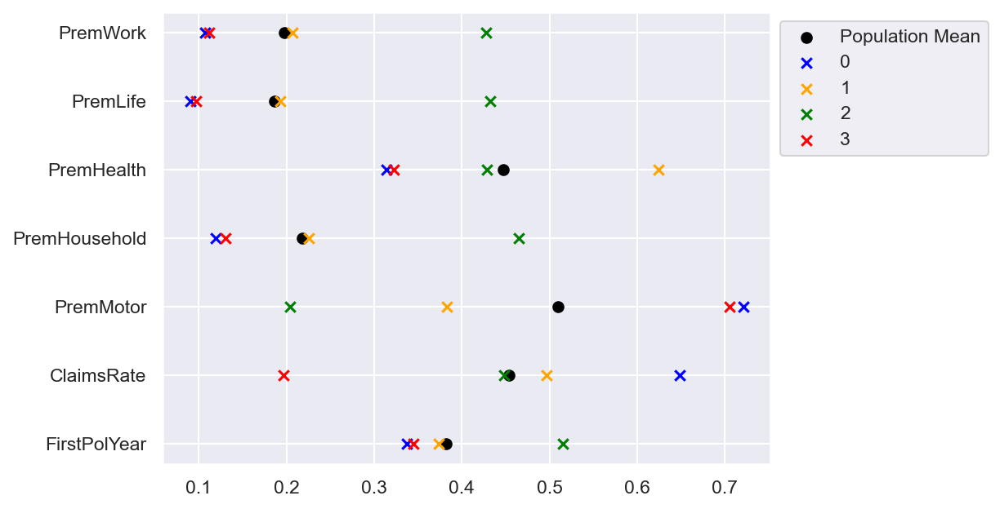



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



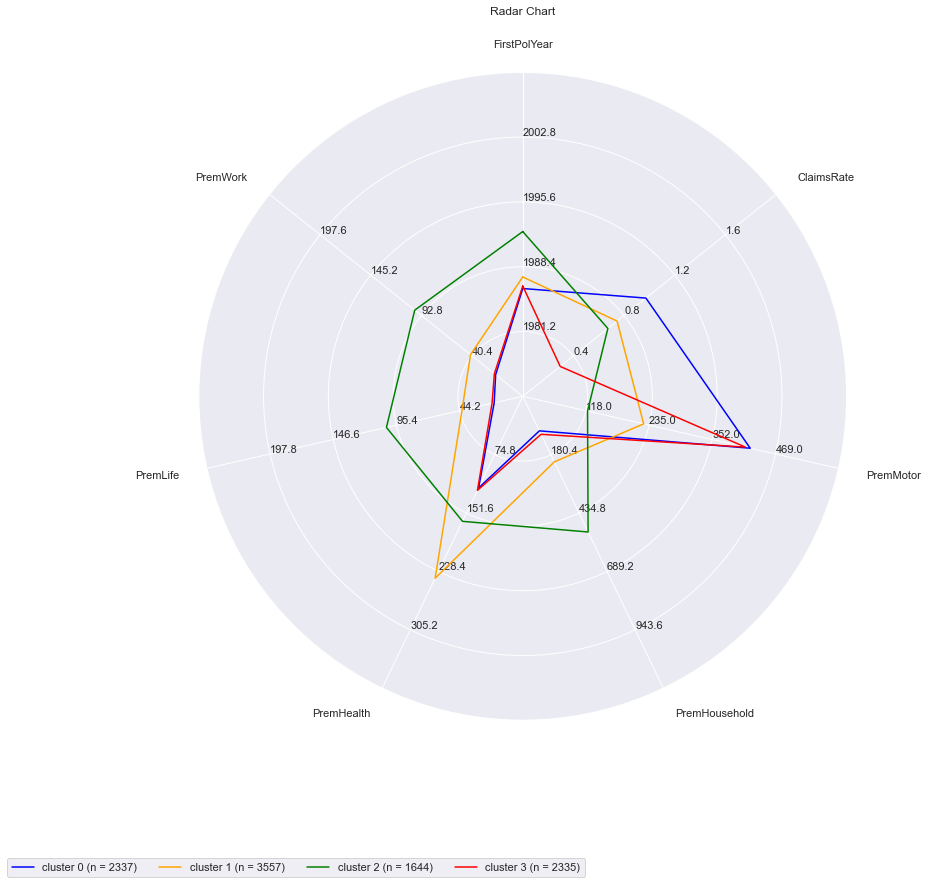

In [129]:
# plot cluster means vs population mean
# plot radarplot

# KMeans
cluster_viz_report(df_values_unscaled , df_values, kmeans_val_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



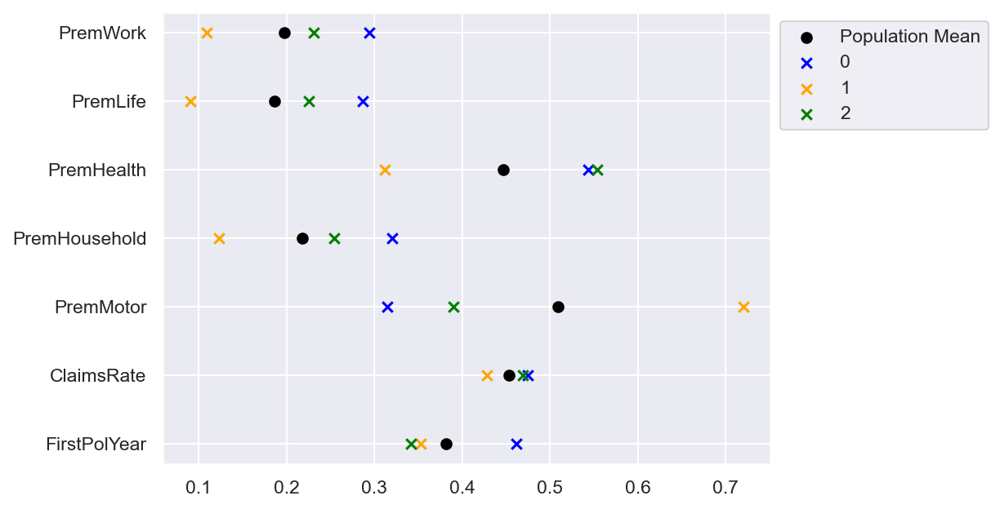



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



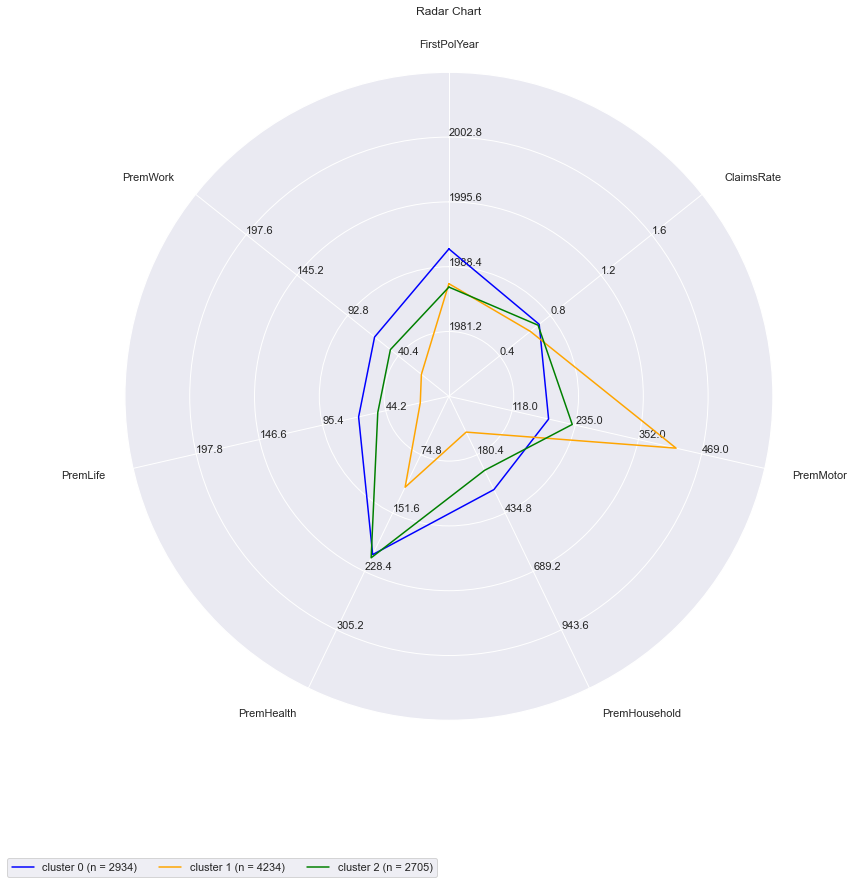

In [130]:
# plot cluster means vs population mean
# plot radarplot

# Agglomerative
cluster_viz_report(df_values_unscaled ,df_values, agg_labels, verbose=1)

<a class="anchor" id="7.4"> 

## 7.4 Inside analyses Perspective - Demography

 </a>



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



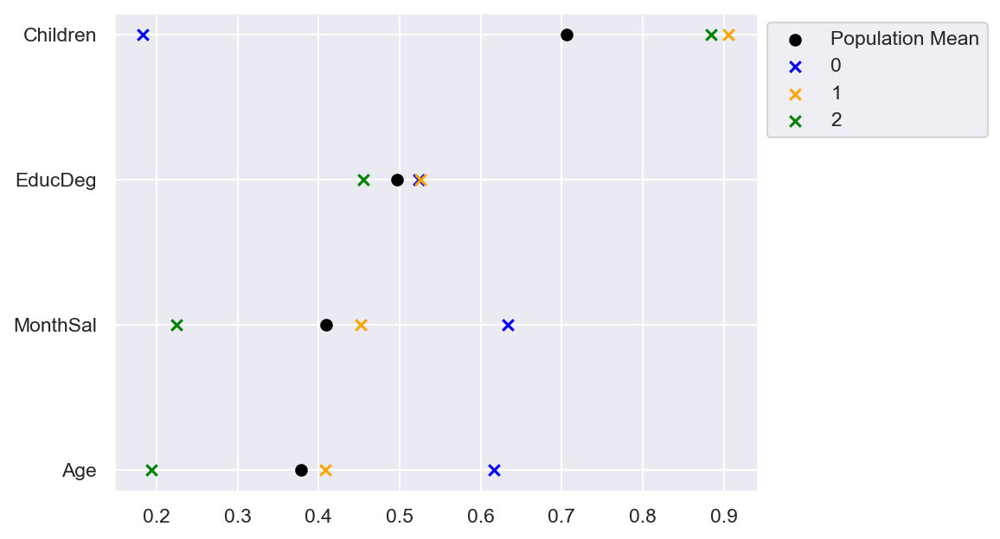



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



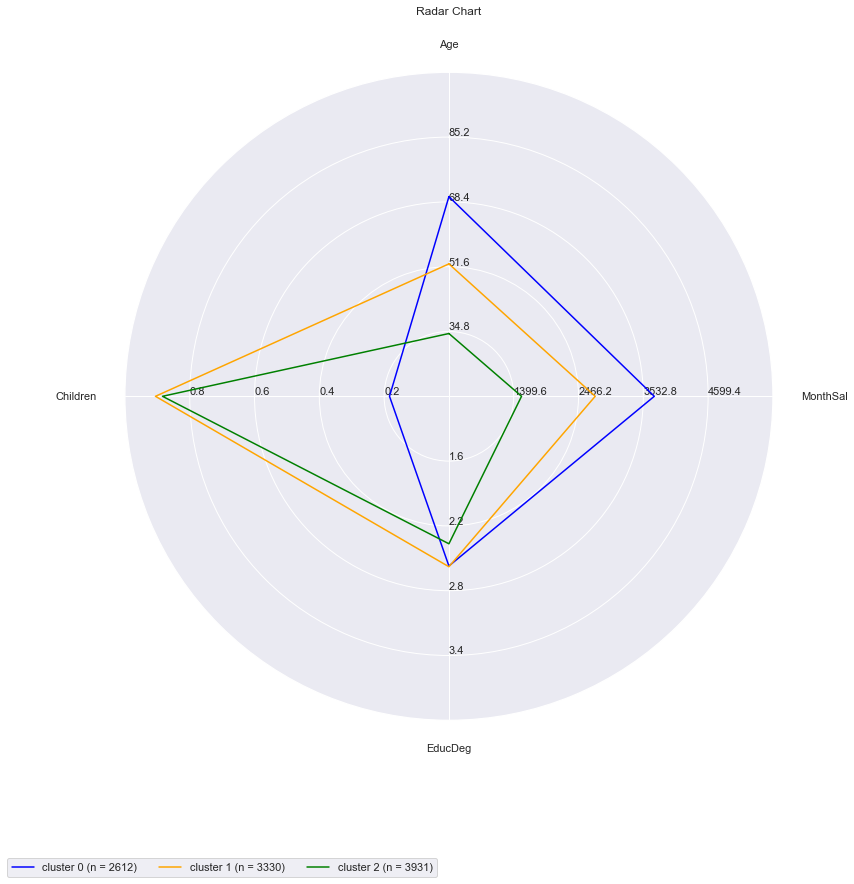

In [131]:
# plot cluster means vs population mean
# plot radarplot

# KPrototype
cluster_viz_report(df_demo_unscaled ,df_demo, kp_dem_labels, verbose=1)

---
<a class="anchor" id="8"> 

# 8. Merging Perspectives  

</a>

In [132]:
# make a copy of the needed dataframes
# 1. dataframe of values perspective
# 2. dataframe of demographic perspective
df_kmeans_val = df_values.copy()
df_kp_demo = df_demo.copy()

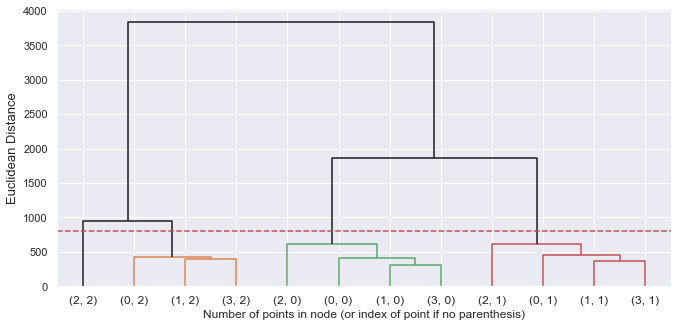

In [133]:
###########
# Final training of KMeans algorithm (4 cluster)
kmeans_val_labels = KMeans(n_clusters=4, init='k-means++').fit_predict(df_kmeans_val)
kmeans_val_labels

###########
# Final training of KPrototypes algorithm (3 cluster)
# dataframe to an array
smart_array = df_kp_demo.values
# All numerical datatypes need to be saved as type float
smart_array[:, 0] = smart_array[:,0].astype(float)
smart_array[:, 1] = smart_array[:,1].astype(float)
# make categorical features to index
# The k-prototype method needs an index of all categorical variables
categorical_index = list(range(2,4))
categorical_index
kp_model = KPrototypes(n_clusters=3, init='Huang', random_state=42, n_jobs=-1)
kp_model.fit_predict(smart_array, categorical=categorical_index)
kp_dem_labels= kp_model.labels_.astype(int)
df_merge = df_all_unscaled.copy()
df_merge['demo_labels'] = kmeans_val_labels
df_merge['val_labels'] = kp_dem_labels

###########
# Centroids of the concatenated cluster labels
df_centroids = df_merge.groupby(['demo_labels', 'val_labels'])[df_merge.columns].mean()

###########
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', distance_threshold=0, n_clusters=None)
hclust_labels = hclust.fit_predict(df_centroids)

###########
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

###########
# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 800
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1100, colors="r", linestyles="dashed")
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [134]:
n_clus = 4

# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(linkage='ward',affinity='euclidean', n_clusters=n_clus)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

###########
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = df_merge.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['demo_labels'], row['val_labels'])
    ], axis=1
)

# Merged cluster centroids
merged_labels = df_['merged_labels']

###########
unscaled = pd.merge(df_feature_engineering,categorical_features,left_index=True,right_index=True).drop(columns=['GeoLivArea'])
scaled = pd.merge(df_scaled,categorical_features,left_index=True,right_index=True).drop(columns=['GeoLivArea'])

---
<a class="anchor" id="9"> 
    
# 9. Final Solution

</a>



---------------------------------------------  VALUE OVERVIEW BY MEAN ------------------------------------------



,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,PremTotal,EducDeg,Children
labels,,,,,,,,,,,,,
0,1985.883544,2740.912613,218.855733,0.649030,387.332483,128.533183,124.341861,25.727790,25.552462,52.330330,691.487780,2.578078,0.905706
1,1988.117313,1660.963721,194.620054,0.690675,303.684767,151.119684,194.422952,29.771764,30.451875,35.581178,709.451041,2.626437,0.936422
2,1986.284571,3713.476263,199.126838,0.706103,266.806344,203.035662,201.996643,40.588373,38.625463,69.759954,751.052485,2.571210,0.183384
3,1993.959372,1206.668701,301.961735,0.687428,103.458858,537.750131,165.091376,109.202677,105.149765,31.107236,1020.652806,1.732345,0.756757




--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



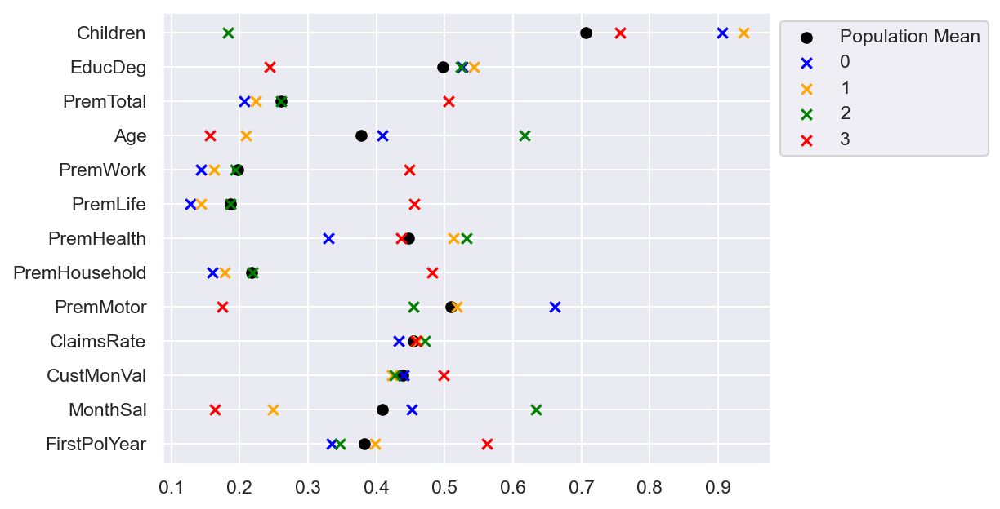



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



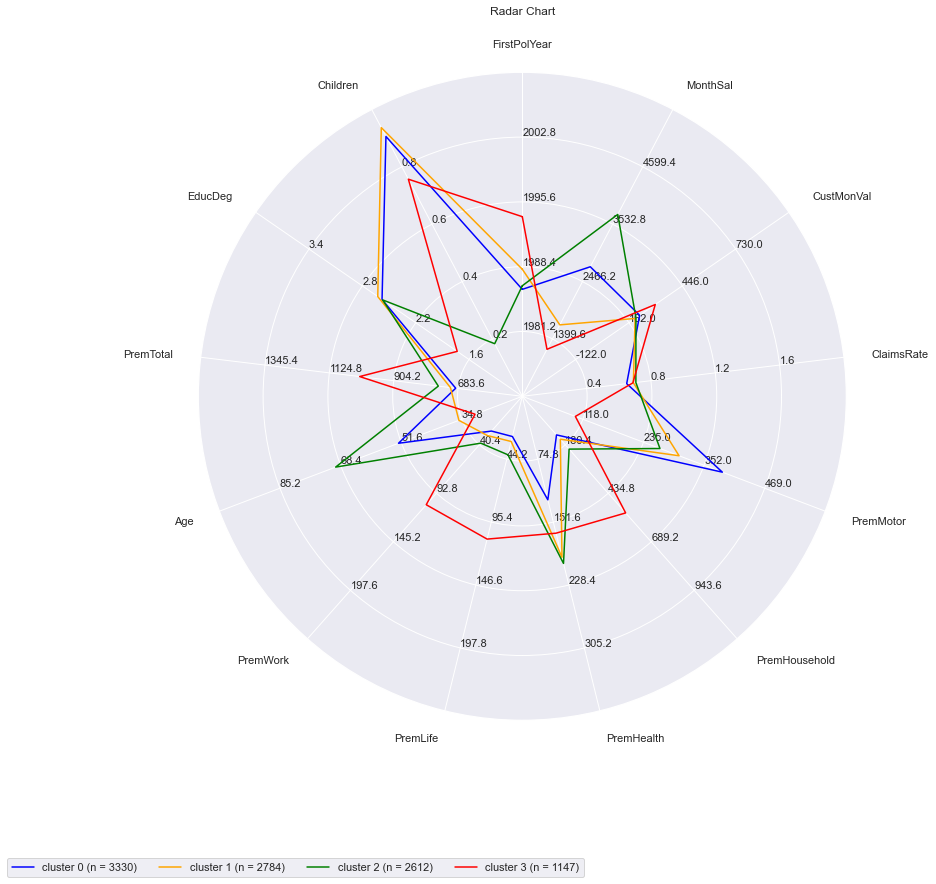



-------------------------------------------------- T-SNE & U-MAP -----------------------------------------------



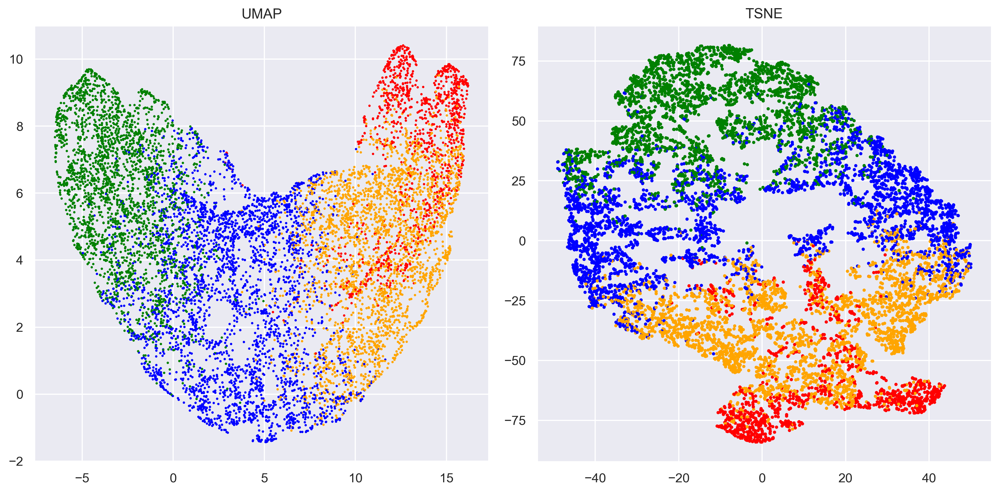



-------------------------------------------------- DECISION TREE -----------------------------------------------



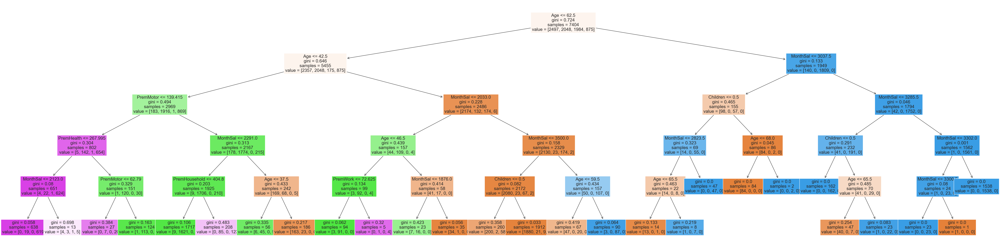



-------------------------------------------CLUSTER DISTRIBUTION BY FEATURE -------------------------------------



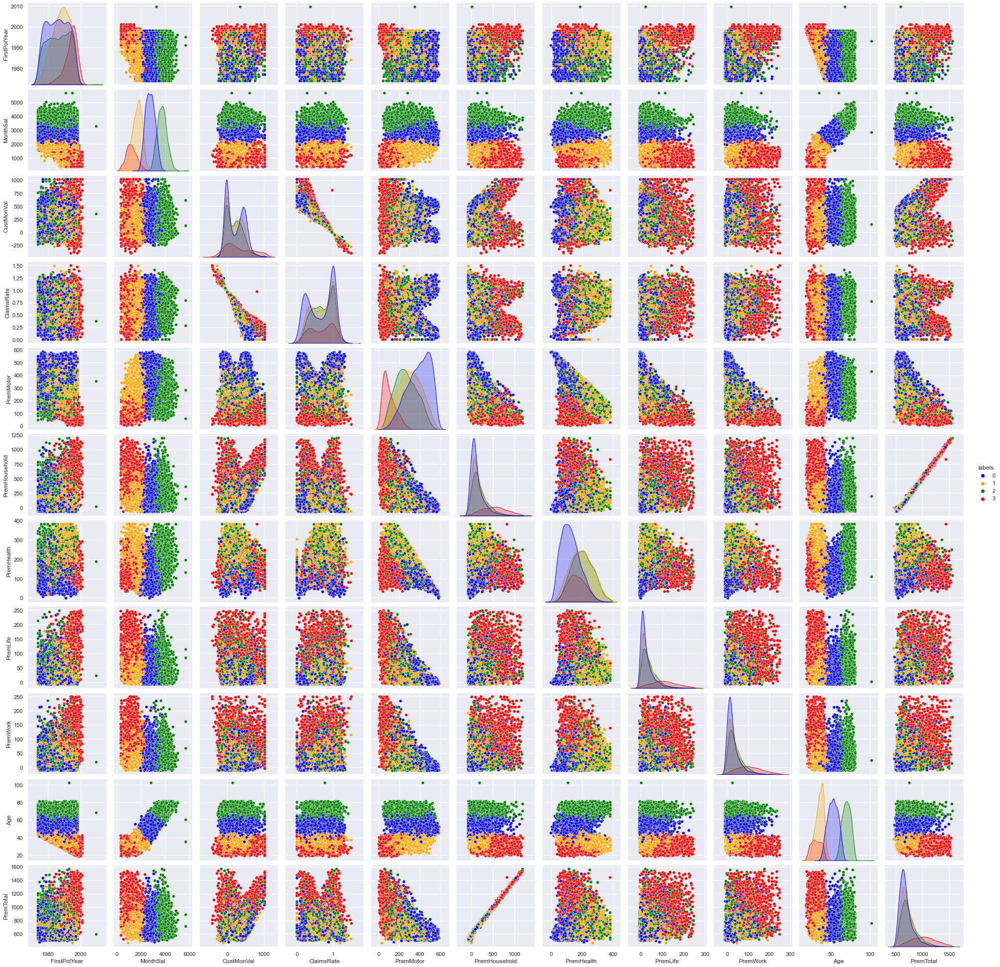

In [135]:
cluster_viz_report(unscaled , scaled, merged_labels, verbose=3)

---
<a class="anchor" id="10"> 
    
# 10. Semi-Supervised implementation
    
</a>

In [136]:
# Preparing the data
df_dt = pd.concat([df_all_unscaled, merged_labels], axis=1)
X = df_dt.drop(columns=['merged_labels'])
y = df_dt.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42)
# calculate a cross validated score
score = np.mean(cross_val_score(dt, X=df_dt.drop(columns=['merged_labels']), y=df_dt.merged_labels))
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(score))

It is estimated that in average, we are able to predict 0.95% of the customers correctly


In [137]:
# get outlier observations - the ones not used for clustering
df_to_predict = df_decision_tree.loc[~df_decision_tree.index.isin(df_all_unscaled.index)]

# fit decision tree
dt = DecisionTreeClassifier(random_state=42).fit(X,y)

#predict labels for outlier observations
dt_labels = dt.predict(df_to_predict)

In [138]:
# scale dataframe to visualize the predicted observations
scl = StandardScaler()
df_to_predict_scaled = pd.DataFrame(scl.fit_transform(df_to_predict), index = df_to_predict.index ,columns = df_to_predict.columns)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



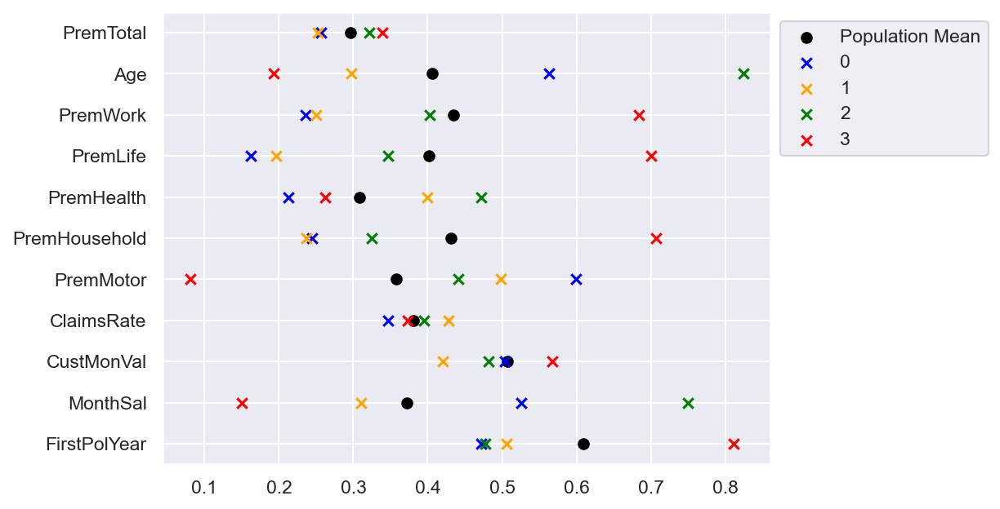



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



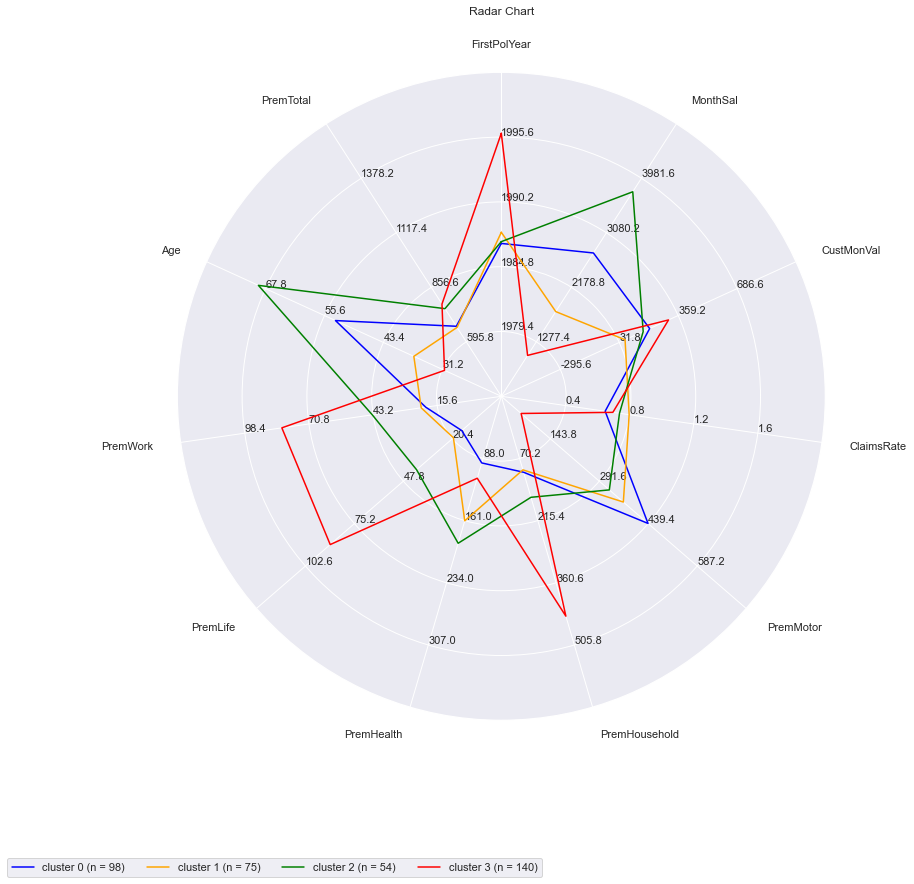

In [139]:
cluster_viz_report(df_to_predict , df_to_predict_scaled, dt_labels, verbose=1)



--------------------------------------------- CLUSTER PROFILE - MEANS ------------------------------------------



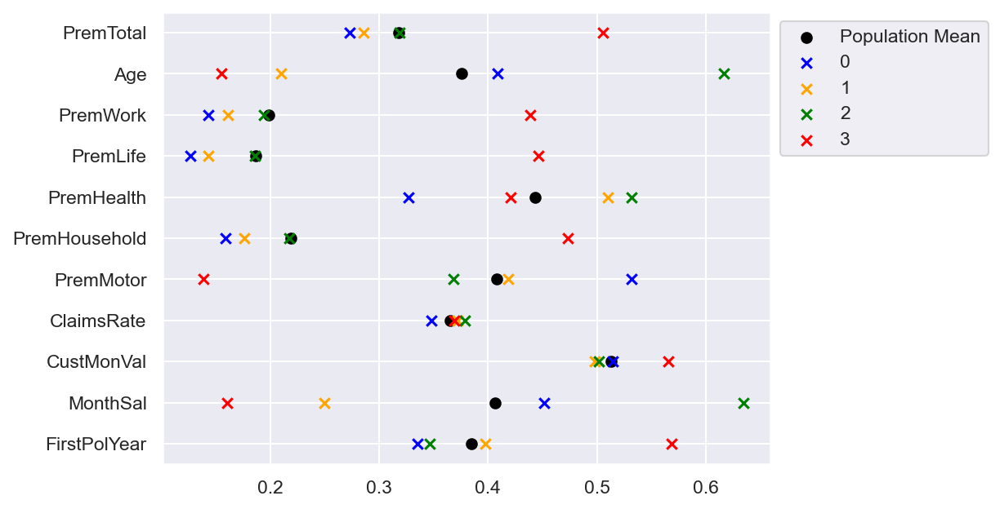



--------------------------------------------- CLUSTER PROFILE - RADAR ------------------------------------------



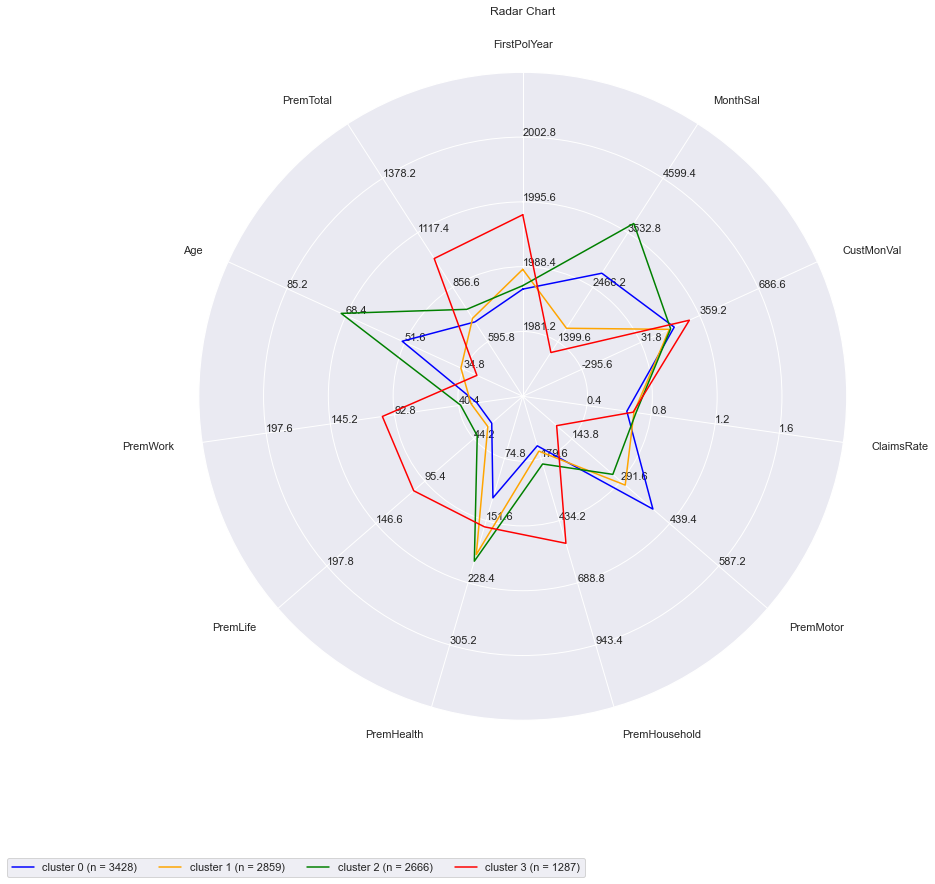

In [141]:
# adding outliers filtered out at preprocessing to our clean dataset used for clustering
# combine labels - clustering labels + classified labels
merged_labels_lst = list(merged_labels.values)
for i in dt_labels:
    merged_labels_lst.append(i)
    
# combine both dataframes - clustering dataframe + outlier dataframe 
df_combo = pd.concat([df_all_unscaled, df_to_predict])

# scale data for visualization
scl = StandardScaler()
df_combo_scaled = pd.DataFrame(scl.fit_transform(df_combo), index = df_combo.index ,columns = df_combo.columns)

cluster_viz_report(df_combo , df_combo_scaled, merged_labels_lst, verbose=1)